# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

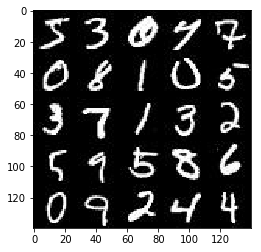

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

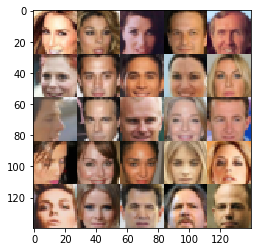

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [61]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    in_real = tf.placeholder(tf.float32, shape=(None, image_height, image_width, image_channels), name='input_real')
    in_z  = tf.placeholder(tf.float32, shape=(None,z_dim), name='input_z')
    lr = tf.placeholder(tf.float32, shape=(), name='learning_rate')
    
    return in_real, in_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [62]:
def discriminator(images, reuse=False, alpha=0.1, keep_prob=1.0):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    

    with tf.variable_scope('discriminator', reuse=reuse):
        # Input images are 28x28x3
        x1 = tf.layers.conv2d(images, 128, 5, kernel_initializer=tf.contrib.layers.xavier_initializer(), strides=2, padding="same")
        if (keep_prob < 1.0):
            x1 = tf.nn.dropout(x1, keep_prob)
        x1 = tf.maximum(x1 * alpha, x1)
        # Should now be 14 x 14 x 128
        
        x2 = tf.layers.conv2d(x1, 256, 5, kernel_initializer=tf.contrib.layers.xavier_initializer(), strides=2, padding="same")
        x2 = tf.layers.batch_normalization(x2, training = True)
        if (keep_prob < 1.0):
            x2 = tf.nn.dropout(x2, keep_prob)
        x2 = tf.maximum(x2 * alpha, x2)
        # Should now be 7 x 7 x 256
        
        x3 = tf.layers.conv2d(x2, 512, 5, kernel_initializer=tf.contrib.layers.xavier_initializer(), strides=2, padding="same")
        x3 = tf.layers.batch_normalization(x3, training = True)
        if (keep_prob < 1.0):
            x3 = tf.nn.dropout(x3, keep_prob)
        x3 = tf.maximum(x3 * alpha, x3)
        # Should now be at 4 x 4 x 512
        
        # Flatten
        logits = tf.layers.dense(tf.reshape(x3, (-1, 4*4*256)), 1)
        outputs = tf.sigmoid(logits)
        
        
        

    return outputs, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [63]:
def generator(z, out_channel_dim, is_train=True, alpha=0.1, keep_prob=1.0):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    with tf.variable_scope("generator", reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        
        # CONV 1
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        if (keep_prob < 1.0):
            x1 = tf.nn.dropout(x1, keep_prob)
        x1 = tf.maximum(alpha * x1, x1)
        # This should now be a 7 x 7 x 256 output
        
        # CONV2
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        if (keep_prob < 1.0):
            x2 = tf.nn.dropout(x2, keep_prob)
        x2 = tf.maximum(alpha * x2, x2)
        # This should now be  14 x 14 x 128
        
       
        # CONV3
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        if (keep_prob < 1.0):
            x3 = tf.nn.dropout(x3, keep_prob)
        x3 = tf.maximum(alpha * x3, x3) 
        # This should now be 28 x 28 x 64
        
        # Output layer, 28x28xchannel_dims
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same')
        # This should now be 28 x 28 x channel dims
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [64]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.1, smooth=0.1, d_keep_prob=1.0, g_keep_prob=1.0):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    # Generator
    g_model = generator(input_z, out_channel_dim, alpha=alpha, keep_prob=g_keep_prob)
    
    # Discriminator
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha, keep_prob = d_keep_prob)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha, keep_prob = d_keep_prob)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [65]:
def model_opt(d_loss, g_loss, d_learning_rate=0.001, g_learning_rate=0.001, beta1=0.5):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(d_learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(g_learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [66]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [67]:
def train(epoch_count, batch_size, z_dim, d_learning_rate, g_learning_rate, beta1, d_keep_prob, g_keep_prob, alpha, smooth, get_batches, data_shape, data_image_mode, 
          print_every=10, show_every=100):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha, smooth, d_keep_prob, g_keep_prob)
    d_opt, g_opt = model_opt(d_loss, g_loss, d_learning_rate, g_learning_rate, beta1)
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                # Re-size the images in the batch to be -1 to 1 (current -0.5 to 0.5)
                batch_images *= 2.0
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z})

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i + 1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
        
        # Print out final loss calculations and images
        train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
        train_loss_g = g_loss.eval({input_z: batch_z})
        print("Epoch {}/{}...".format(epoch_i + 1, epochs), "Discriminator Loss: {:.4f}...".format(train_loss_d), "Generator Loss: {:.4f}".format(train_loss_g))
        show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
        print("DONE")
        

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/1... Discriminator Loss: 0.6291... Generator Loss: 15.6645
Epoch 1/1... Discriminator Loss: 0.3639... Generator Loss: 13.1300
Epoch 1/1... Discriminator Loss: 0.3508... Generator Loss: 11.1703
Epoch 1/1... Discriminator Loss: 0.3433... Generator Loss: 9.7817
Epoch 1/1... Discriminator Loss: 0.3425... Generator Loss: 9.5486
Epoch 1/1... Discriminator Loss: 0.3478... Generator Loss: 5.5409
Epoch 1/1... Discriminator Loss: 0.4434... Generator Loss: 17.7996
Epoch 1/1... Discriminator Loss: 0.9348... Generator Loss: 1.4309
Epoch 1/1... Discriminator Loss: 1.1790... Generator Loss: 2.8313
Epoch 1/1... Discriminator Loss: 3.2935... Generator Loss: 0.2326


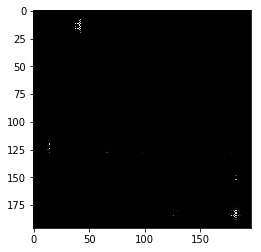

Epoch 1/1... Discriminator Loss: 0.3820... Generator Loss: 4.3478
Epoch 1/1... Discriminator Loss: 0.3715... Generator Loss: 4.8567
Epoch 1/1... Discriminator Loss: 0.3595... Generator Loss: 5.1678
Epoch 1/1... Discriminator Loss: 0.3517... Generator Loss: 5.3115
Epoch 1/1... Discriminator Loss: 0.3417... Generator Loss: 6.8171
Epoch 1/1... Discriminator Loss: 0.4039... Generator Loss: 3.5114
Epoch 1/1... Discriminator Loss: 0.7654... Generator Loss: 1.6224
Epoch 1/1... Discriminator Loss: 0.3841... Generator Loss: 4.1324
Epoch 1/1... Discriminator Loss: 0.5931... Generator Loss: 2.3553
Epoch 1/1... Discriminator Loss: 1.0204... Generator Loss: 1.3839


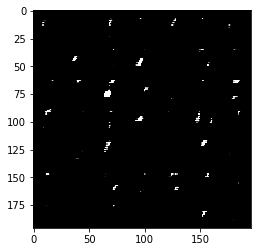

Epoch 1/1... Discriminator Loss: 0.9085... Generator Loss: 2.2833
Epoch 1/1... Discriminator Loss: 1.0604... Generator Loss: 1.0214
Epoch 1/1... Discriminator Loss: 0.9325... Generator Loss: 1.3615
Epoch 1/1... Discriminator Loss: 1.9117... Generator Loss: 0.5345
Epoch 1/1... Discriminator Loss: 0.9226... Generator Loss: 1.0861
Epoch 1/1... Discriminator Loss: 1.1187... Generator Loss: 0.9183
Epoch 1/1... Discriminator Loss: 0.8949... Generator Loss: 1.0923
Epoch 1/1... Discriminator Loss: 2.3515... Generator Loss: 4.2704
Epoch 1/1... Discriminator Loss: 1.6829... Generator Loss: 4.4102
Epoch 1/1... Discriminator Loss: 1.1153... Generator Loss: 0.8417


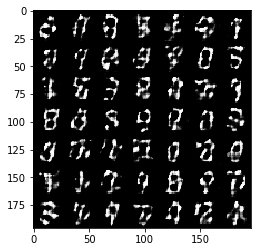

Epoch 1/1... Discriminator Loss: 0.9065... Generator Loss: 1.4430
Epoch 1/1... Discriminator Loss: 1.8901... Generator Loss: 0.5650
Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 1.3316
Epoch 1/1... Discriminator Loss: 1.2466... Generator Loss: 0.9487
Epoch 1/1... Discriminator Loss: 1.0390... Generator Loss: 1.7826
Epoch 1/1... Discriminator Loss: 0.9936... Generator Loss: 1.1131
Epoch 1/1... Discriminator Loss: 1.1953... Generator Loss: 1.9423
Epoch 1/1... Discriminator Loss: 1.1838... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 1.0312... Generator Loss: 0.8766
Epoch 1/1... Discriminator Loss: 1.1533... Generator Loss: 0.9311


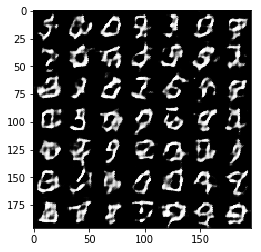

Epoch 1/1... Discriminator Loss: 1.9817... Generator Loss: 0.3582
Epoch 1/1... Discriminator Loss: 0.9723... Generator Loss: 1.2932
Epoch 1/1... Discriminator Loss: 1.0582... Generator Loss: 1.1324
Epoch 1/1... Discriminator Loss: 1.2287... Generator Loss: 1.1830
Epoch 1/1... Discriminator Loss: 0.9819... Generator Loss: 1.4677
Epoch 1/1... Discriminator Loss: 1.1854... Generator Loss: 1.5418
Epoch 1/1... Discriminator Loss: 1.4937... Generator Loss: 0.6140
Epoch 1/1... Discriminator Loss: 1.1725... Generator Loss: 0.9489
Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.3262... Generator Loss: 0.7479


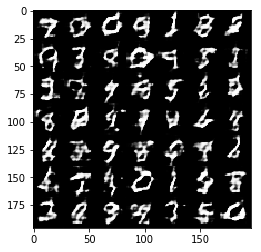

Epoch 1/1... Discriminator Loss: 1.1598... Generator Loss: 0.9873
Epoch 1/1... Discriminator Loss: 1.3126... Generator Loss: 0.7493
Epoch 1/1... Discriminator Loss: 1.0260... Generator Loss: 2.1323
Epoch 1/1... Discriminator Loss: 1.1002... Generator Loss: 1.0591
Epoch 1/1... Discriminator Loss: 1.1147... Generator Loss: 2.2605
Epoch 1/1... Discriminator Loss: 1.1314... Generator Loss: 0.9710
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 1.0501... Generator Loss: 1.0509
Epoch 1/1... Discriminator Loss: 1.0462... Generator Loss: 1.2247
Epoch 1/1... Discriminator Loss: 1.1783... Generator Loss: 0.8376


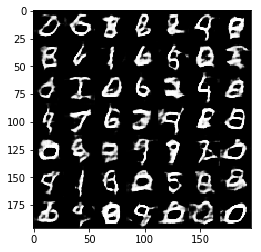

Epoch 1/1... Discriminator Loss: 1.1773... Generator Loss: 1.4967
Epoch 1/1... Discriminator Loss: 1.1776... Generator Loss: 0.9502
Epoch 1/1... Discriminator Loss: 0.9914... Generator Loss: 1.0706
Epoch 1/1... Discriminator Loss: 1.0970... Generator Loss: 1.1701
Epoch 1/1... Discriminator Loss: 0.9075... Generator Loss: 1.6714
Epoch 1/1... Discriminator Loss: 1.6412... Generator Loss: 2.6055
Epoch 1/1... Discriminator Loss: 1.1275... Generator Loss: 1.5372
Epoch 1/1... Discriminator Loss: 0.9041... Generator Loss: 1.2462
Epoch 1/1... Discriminator Loss: 0.9964... Generator Loss: 2.0948
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 2.9089


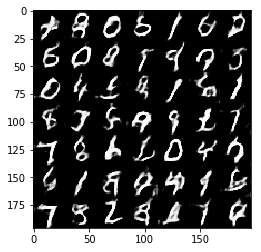

Epoch 1/1... Discriminator Loss: 1.2076... Generator Loss: 0.8994
Epoch 1/1... Discriminator Loss: 1.0031... Generator Loss: 1.1236
Epoch 1/1... Discriminator Loss: 1.1838... Generator Loss: 0.8442
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 0.6385
Epoch 1/1... Discriminator Loss: 0.9372... Generator Loss: 1.8730
Epoch 1/1... Discriminator Loss: 0.8861... Generator Loss: 2.7753
Epoch 1/1... Discriminator Loss: 1.0646... Generator Loss: 0.9013
Epoch 1/1... Discriminator Loss: 0.8956... Generator Loss: 1.1387
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 0.9836
Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 1.1109


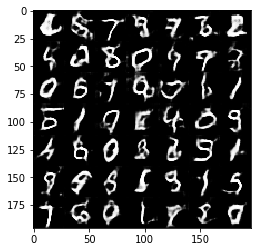

Epoch 1/1... Discriminator Loss: 0.7384... Generator Loss: 1.5084
Epoch 1/1... Discriminator Loss: 0.9728... Generator Loss: 1.3358
Epoch 1/1... Discriminator Loss: 1.2171... Generator Loss: 0.7627
Epoch 1/1... Discriminator Loss: 1.0952... Generator Loss: 2.2546
Epoch 1/1... Discriminator Loss: 1.0550... Generator Loss: 1.0636
Epoch 1/1... Discriminator Loss: 1.0457... Generator Loss: 1.2235
Epoch 1/1... Discriminator Loss: 0.9012... Generator Loss: 1.2198
Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.6293
Epoch 1/1... Discriminator Loss: 0.9978... Generator Loss: 1.0839
Epoch 1/1... Discriminator Loss: 0.9210... Generator Loss: 1.0438


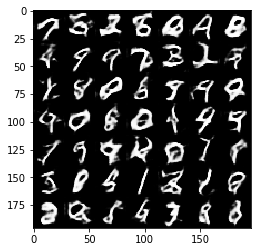

Epoch 1/1... Discriminator Loss: 0.8797... Generator Loss: 2.2950
Epoch 1/1... Discriminator Loss: 0.8835... Generator Loss: 1.1618
Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 0.7176
Epoch 1/1... Discriminator Loss: 1.1876... Generator Loss: 0.9518
Epoch 1/1... Discriminator Loss: 1.0862... Generator Loss: 2.0142
Epoch 1/1... Discriminator Loss: 0.9526... Generator Loss: 1.0168
Epoch 1/1... Discriminator Loss: 1.2047... Generator Loss: 0.8991
Epoch 1/1... Discriminator Loss: 0.9990... Generator Loss: 2.5970
Epoch 1/1... Discriminator Loss: 0.9853... Generator Loss: 1.2784
Epoch 1/1... Discriminator Loss: 1.0044... Generator Loss: 0.9567


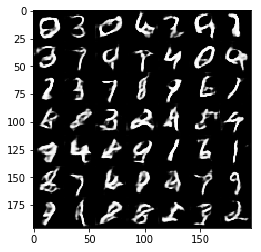

Epoch 1/1... Discriminator Loss: 0.9046... Generator Loss: 1.7434
Epoch 1/1... Discriminator Loss: 0.8846... Generator Loss: 1.6172
Epoch 1/1... Discriminator Loss: 0.9931... Generator Loss: 0.8395
Epoch 1/1... Discriminator Loss: 0.9336... Generator Loss: 2.4245
Epoch 1/1... Discriminator Loss: 1.2600... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 0.9634... Generator Loss: 1.5559
Epoch 1/1... Discriminator Loss: 0.8360... Generator Loss: 1.2505
Epoch 1/1... Discriminator Loss: 1.0514... Generator Loss: 1.4750
Epoch 1/1... Discriminator Loss: 0.8211... Generator Loss: 1.5083
Epoch 1/1... Discriminator Loss: 1.7239... Generator Loss: 0.4991


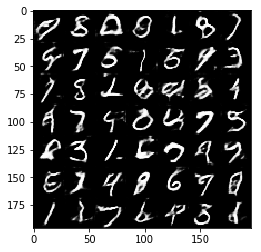

Epoch 1/1... Discriminator Loss: 0.9075... Generator Loss: 1.4436
Epoch 1/1... Discriminator Loss: 0.8393... Generator Loss: 1.7713
Epoch 1/1... Discriminator Loss: 1.2895... Generator Loss: 0.6607
Epoch 1/1... Discriminator Loss: 1.0388... Generator Loss: 1.3108
Epoch 1/1... Discriminator Loss: 0.9774... Generator Loss: 1.0918
Epoch 1/1... Discriminator Loss: 0.9599... Generator Loss: 1.3215
Epoch 1/1... Discriminator Loss: 0.9606... Generator Loss: 1.2490
Epoch 1/1... Discriminator Loss: 0.8225... Generator Loss: 2.0993
Epoch 1/1... Discriminator Loss: 0.9120... Generator Loss: 1.4232
Epoch 1/1... Discriminator Loss: 0.7991... Generator Loss: 1.7675


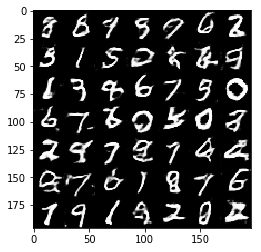

Epoch 1/1... Discriminator Loss: 0.6857... Generator Loss: 1.7918
Epoch 1/1... Discriminator Loss: 0.9733... Generator Loss: 2.2576
Epoch 1/1... Discriminator Loss: 1.8321... Generator Loss: 0.4307
Epoch 1/1... Discriminator Loss: 0.8167... Generator Loss: 1.5585
Epoch 1/1... Discriminator Loss: 0.7682... Generator Loss: 1.3802
Epoch 1/1... Discriminator Loss: 1.2473... Generator Loss: 2.7861
Epoch 1/1... Discriminator Loss: 0.9711... Generator Loss: 1.4768
Epoch 1/1... Discriminator Loss: 1.1403... Generator Loss: 3.0784
Epoch 1/1... Discriminator Loss: 0.7992... Generator Loss: 1.1170
Epoch 1/1... Discriminator Loss: 0.9705... Generator Loss: 0.9173


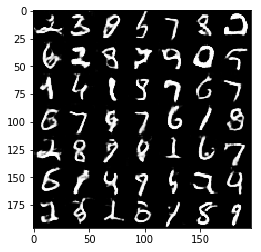

Epoch 1/1... Discriminator Loss: 0.9588... Generator Loss: 2.0116
Epoch 1/1... Discriminator Loss: 1.0424... Generator Loss: 1.8133
Epoch 1/1... Discriminator Loss: 1.0648... Generator Loss: 0.9580
Epoch 1/1... Discriminator Loss: 0.8981... Generator Loss: 1.4329
Epoch 1/1... Discriminator Loss: 1.0409... Generator Loss: 0.9884
Epoch 1/1... Discriminator Loss: 1.1066... Generator Loss: 0.8818
Epoch 1/1... Discriminator Loss: 0.8301... Generator Loss: 1.4357
Epoch 1/1... Discriminator Loss: 0.7982... Generator Loss: 2.2596
Epoch 1/1... Discriminator Loss: 0.6437... Generator Loss: 2.6740
Epoch 1/1... Discriminator Loss: 1.3793... Generator Loss: 0.6809


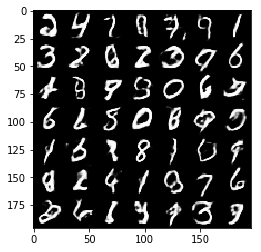

Epoch 1/1... Discriminator Loss: 0.7862... Generator Loss: 1.7454
Epoch 1/1... Discriminator Loss: 0.9470... Generator Loss: 1.2292
Epoch 1/1... Discriminator Loss: 1.0167... Generator Loss: 2.1089
Epoch 1/1... Discriminator Loss: 1.0380... Generator Loss: 1.1554
Epoch 1/1... Discriminator Loss: 0.7117... Generator Loss: 1.8196
Epoch 1/1... Discriminator Loss: 1.0288... Generator Loss: 0.8912
Epoch 1/1... Discriminator Loss: 1.2388... Generator Loss: 0.7567
Epoch 1/1... Discriminator Loss: 0.7856... Generator Loss: 1.4205
Epoch 1/1... Discriminator Loss: 1.1010... Generator Loss: 0.9312
Epoch 1/1... Discriminator Loss: 0.9078... Generator Loss: 1.2486


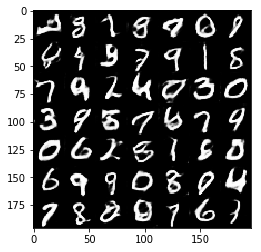

Epoch 1/1... Discriminator Loss: 1.6483... Generator Loss: 0.4867
Epoch 1/1... Discriminator Loss: 0.7912... Generator Loss: 1.3650
Epoch 1/1... Discriminator Loss: 1.0059... Generator Loss: 1.3799
Epoch 1/1... Discriminator Loss: 0.8068... Generator Loss: 1.3599
Epoch 1/1... Discriminator Loss: 0.6090... Generator Loss: 2.0102
Epoch 1/1... Discriminator Loss: 0.7798... Generator Loss: 1.5288
Epoch 1/1... Discriminator Loss: 0.6310... Generator Loss: 1.7052
Epoch 1/1... Discriminator Loss: 0.8475... Generator Loss: 1.4474
Epoch 1/1... Discriminator Loss: 1.0776... Generator Loss: 0.9765
Epoch 1/1... Discriminator Loss: 0.8728... Generator Loss: 1.5178


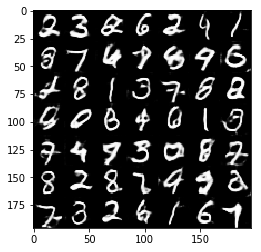

Epoch 1/1... Discriminator Loss: 1.1424... Generator Loss: 0.8408
Epoch 1/1... Discriminator Loss: 0.8062... Generator Loss: 1.6398
Epoch 1/1... Discriminator Loss: 0.8360... Generator Loss: 2.1050
Epoch 1/1... Discriminator Loss: 0.6935... Generator Loss: 2.0552
Epoch 1/1... Discriminator Loss: 0.6085... Generator Loss: 2.5012
Epoch 1/1... Discriminator Loss: 0.7953... Generator Loss: 1.5953
Epoch 1/1... Discriminator Loss: 1.3998... Generator Loss: 0.4487
Epoch 1/1... Discriminator Loss: 0.5246... Generator Loss: 2.6462
Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.9919
Epoch 1/1... Discriminator Loss: 1.0436... Generator Loss: 1.2826


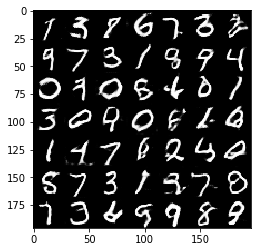

Epoch 1/1... Discriminator Loss: 0.6402... Generator Loss: 1.9261
Epoch 1/1... Discriminator Loss: 0.8990... Generator Loss: 1.6523
Epoch 1/1... Discriminator Loss: 0.9716... Generator Loss: 1.2967
Epoch 1/1... Discriminator Loss: 0.9440... Generator Loss: 1.4664
Epoch 1/1... Discriminator Loss: 0.8264... Generator Loss: 1.6849
Epoch 1/1... Discriminator Loss: 0.7295... Generator Loss: 1.5652
Epoch 1/1... Discriminator Loss: 1.1827... Generator Loss: 0.9473
Epoch 1/1... Discriminator Loss: 1.2025... Generator Loss: 3.4482
Epoch 1/1... Discriminator Loss: 0.6515... Generator Loss: 1.9087
Epoch 1/1... Discriminator Loss: 0.6827... Generator Loss: 2.3966


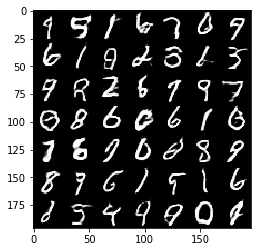

Epoch 1/1... Discriminator Loss: 0.7298... Generator Loss: 1.8397
Epoch 1/1... Discriminator Loss: 0.7830... Generator Loss: 1.4823
Epoch 1/1... Discriminator Loss: 0.9561... Generator Loss: 1.8319
Epoch 1/1... Discriminator Loss: 0.9222... Generator Loss: 1.1658
Epoch 1/1... Discriminator Loss: 0.7050... Generator Loss: 2.1310
Epoch 1/1... Discriminator Loss: 0.9594... Generator Loss: 1.1142
Epoch 1/1... Discriminator Loss: 1.0329... Generator Loss: 0.9708
Epoch 1/1... Discriminator Loss: 0.7614... Generator Loss: 1.4668


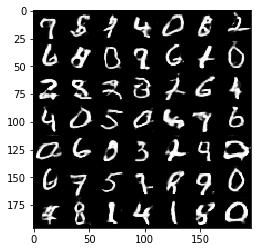

DONE


In [72]:
batch_size = 32
z_dim = 100
beta1 = 0.5
alpha = 0.1

d_learning_rate = 0.001
g_learning_rate = 0.001
d_keep_prob = 0.8
g_keep_prob = 0.5
smooth = 0.1



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, d_learning_rate, g_learning_rate, beta1, d_keep_prob, g_keep_prob, alpha, smooth, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 0.6436... Generator Loss: 5.0924
Epoch 1/5... Discriminator Loss: 0.4809... Generator Loss: 4.2513
Epoch 1/5... Discriminator Loss: 0.3865... Generator Loss: 4.8842
Epoch 1/5... Discriminator Loss: 1.7532... Generator Loss: 0.8760
Epoch 1/5... Discriminator Loss: 2.3243... Generator Loss: 0.3745
Epoch 1/5... Discriminator Loss: 0.8860... Generator Loss: 5.2586
Epoch 1/5... Discriminator Loss: 0.6479... Generator Loss: 2.6353
Epoch 1/5... Discriminator Loss: 0.3898... Generator Loss: 5.0826
Epoch 1/5... Discriminator Loss: 0.4973... Generator Loss: 2.5599
Epoch 1/5... Discriminator Loss: 0.6949... Generator Loss: 1.9817


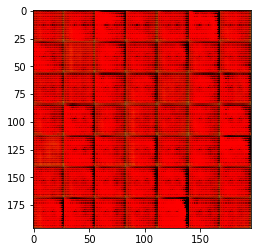

Epoch 1/5... Discriminator Loss: 0.7097... Generator Loss: 1.5679
Epoch 1/5... Discriminator Loss: 0.4039... Generator Loss: 3.4386
Epoch 1/5... Discriminator Loss: 0.4080... Generator Loss: 3.4821
Epoch 1/5... Discriminator Loss: 1.0315... Generator Loss: 1.0481
Epoch 1/5... Discriminator Loss: 0.8577... Generator Loss: 3.0131
Epoch 1/5... Discriminator Loss: 0.7779... Generator Loss: 1.4843
Epoch 1/5... Discriminator Loss: 1.2622... Generator Loss: 0.8131
Epoch 1/5... Discriminator Loss: 1.0901... Generator Loss: 1.1920
Epoch 1/5... Discriminator Loss: 0.8168... Generator Loss: 1.3021
Epoch 1/5... Discriminator Loss: 0.9371... Generator Loss: 1.8832


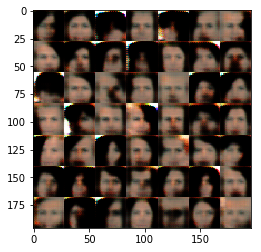

Epoch 1/5... Discriminator Loss: 0.6356... Generator Loss: 2.2432
Epoch 1/5... Discriminator Loss: 1.0826... Generator Loss: 1.2020
Epoch 1/5... Discriminator Loss: 0.9435... Generator Loss: 1.4887
Epoch 1/5... Discriminator Loss: 1.2012... Generator Loss: 0.7431
Epoch 1/5... Discriminator Loss: 1.1950... Generator Loss: 0.6658
Epoch 1/5... Discriminator Loss: 0.9652... Generator Loss: 1.1153
Epoch 1/5... Discriminator Loss: 0.9023... Generator Loss: 1.7260
Epoch 1/5... Discriminator Loss: 1.1977... Generator Loss: 1.2600
Epoch 1/5... Discriminator Loss: 0.9059... Generator Loss: 1.4287
Epoch 1/5... Discriminator Loss: 0.9773... Generator Loss: 1.4901


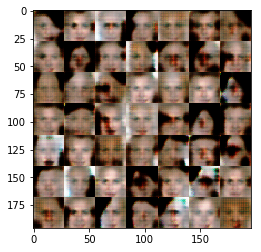

Epoch 1/5... Discriminator Loss: 1.3064... Generator Loss: 1.8787
Epoch 1/5... Discriminator Loss: 0.8985... Generator Loss: 1.7009
Epoch 1/5... Discriminator Loss: 1.4181... Generator Loss: 1.6242
Epoch 1/5... Discriminator Loss: 0.8692... Generator Loss: 1.0886
Epoch 1/5... Discriminator Loss: 1.1987... Generator Loss: 0.7777
Epoch 1/5... Discriminator Loss: 1.4376... Generator Loss: 0.5032
Epoch 1/5... Discriminator Loss: 1.6096... Generator Loss: 0.5458
Epoch 1/5... Discriminator Loss: 1.3105... Generator Loss: 1.9832
Epoch 1/5... Discriminator Loss: 1.3348... Generator Loss: 0.6454
Epoch 1/5... Discriminator Loss: 0.9381... Generator Loss: 1.5270


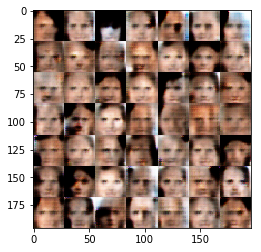

Epoch 1/5... Discriminator Loss: 1.0419... Generator Loss: 1.7651
Epoch 1/5... Discriminator Loss: 1.2847... Generator Loss: 0.9978
Epoch 1/5... Discriminator Loss: 0.8318... Generator Loss: 1.6029
Epoch 1/5... Discriminator Loss: 1.3426... Generator Loss: 0.9779
Epoch 1/5... Discriminator Loss: 1.0124... Generator Loss: 1.1356
Epoch 1/5... Discriminator Loss: 0.8912... Generator Loss: 1.6013
Epoch 1/5... Discriminator Loss: 1.0311... Generator Loss: 1.4974
Epoch 1/5... Discriminator Loss: 1.1545... Generator Loss: 1.1194
Epoch 1/5... Discriminator Loss: 1.9991... Generator Loss: 2.7396
Epoch 1/5... Discriminator Loss: 1.2332... Generator Loss: 1.3089


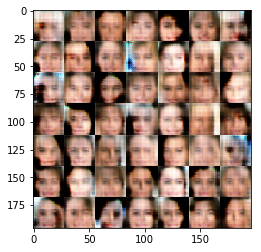

Epoch 1/5... Discriminator Loss: 0.9630... Generator Loss: 1.1641
Epoch 1/5... Discriminator Loss: 1.0000... Generator Loss: 1.1383
Epoch 1/5... Discriminator Loss: 1.0321... Generator Loss: 1.1402
Epoch 1/5... Discriminator Loss: 1.3186... Generator Loss: 0.6175
Epoch 1/5... Discriminator Loss: 0.9034... Generator Loss: 1.1094
Epoch 1/5... Discriminator Loss: 1.7564... Generator Loss: 0.5187
Epoch 1/5... Discriminator Loss: 1.0392... Generator Loss: 0.8322
Epoch 1/5... Discriminator Loss: 1.0581... Generator Loss: 0.9461
Epoch 1/5... Discriminator Loss: 0.9813... Generator Loss: 1.4980
Epoch 1/5... Discriminator Loss: 1.1231... Generator Loss: 0.9530


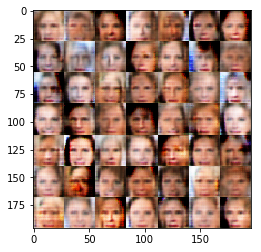

Epoch 1/5... Discriminator Loss: 1.2060... Generator Loss: 1.3612
Epoch 1/5... Discriminator Loss: 1.7647... Generator Loss: 2.7843
Epoch 1/5... Discriminator Loss: 1.3813... Generator Loss: 2.3831
Epoch 1/5... Discriminator Loss: 0.9606... Generator Loss: 1.1768
Epoch 1/5... Discriminator Loss: 1.1851... Generator Loss: 0.8607
Epoch 1/5... Discriminator Loss: 0.7797... Generator Loss: 1.2569
Epoch 1/5... Discriminator Loss: 1.0152... Generator Loss: 1.0031
Epoch 1/5... Discriminator Loss: 1.2771... Generator Loss: 1.2811
Epoch 1/5... Discriminator Loss: 1.2048... Generator Loss: 0.7229
Epoch 1/5... Discriminator Loss: 1.0529... Generator Loss: 0.9610


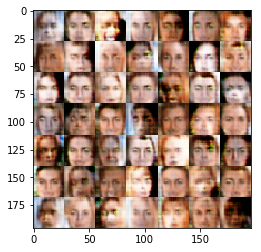

Epoch 1/5... Discriminator Loss: 1.2545... Generator Loss: 1.2908
Epoch 1/5... Discriminator Loss: 0.9911... Generator Loss: 1.5642
Epoch 1/5... Discriminator Loss: 1.6180... Generator Loss: 0.4296
Epoch 1/5... Discriminator Loss: 1.0905... Generator Loss: 0.9792
Epoch 1/5... Discriminator Loss: 1.3137... Generator Loss: 1.2695
Epoch 1/5... Discriminator Loss: 1.1045... Generator Loss: 0.9148
Epoch 1/5... Discriminator Loss: 1.0805... Generator Loss: 1.0523
Epoch 1/5... Discriminator Loss: 1.3730... Generator Loss: 0.5548
Epoch 1/5... Discriminator Loss: 0.9905... Generator Loss: 1.3165
Epoch 1/5... Discriminator Loss: 1.3440... Generator Loss: 0.5487


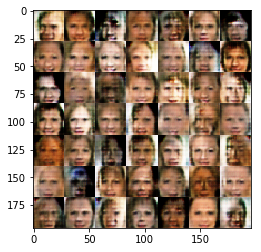

Epoch 1/5... Discriminator Loss: 1.1931... Generator Loss: 1.3029
Epoch 1/5... Discriminator Loss: 1.1741... Generator Loss: 1.1279
Epoch 1/5... Discriminator Loss: 1.3866... Generator Loss: 0.7473
Epoch 1/5... Discriminator Loss: 1.3212... Generator Loss: 1.0594
Epoch 1/5... Discriminator Loss: 1.1922... Generator Loss: 0.9056
Epoch 1/5... Discriminator Loss: 1.2095... Generator Loss: 0.7995
Epoch 1/5... Discriminator Loss: 1.0619... Generator Loss: 0.9885
Epoch 1/5... Discriminator Loss: 1.2756... Generator Loss: 1.2755
Epoch 1/5... Discriminator Loss: 1.0152... Generator Loss: 0.8965
Epoch 1/5... Discriminator Loss: 0.8802... Generator Loss: 1.6535


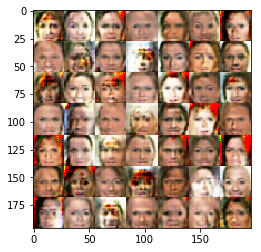

Epoch 1/5... Discriminator Loss: 1.2961... Generator Loss: 0.5887
Epoch 1/5... Discriminator Loss: 1.0460... Generator Loss: 1.3772
Epoch 1/5... Discriminator Loss: 1.1166... Generator Loss: 0.7775
Epoch 1/5... Discriminator Loss: 1.3055... Generator Loss: 1.6067
Epoch 1/5... Discriminator Loss: 1.0136... Generator Loss: 1.1728
Epoch 1/5... Discriminator Loss: 1.0162... Generator Loss: 1.4793
Epoch 1/5... Discriminator Loss: 1.1759... Generator Loss: 1.4168
Epoch 1/5... Discriminator Loss: 1.2835... Generator Loss: 0.6928
Epoch 1/5... Discriminator Loss: 1.1511... Generator Loss: 0.9640
Epoch 1/5... Discriminator Loss: 1.3544... Generator Loss: 1.9186


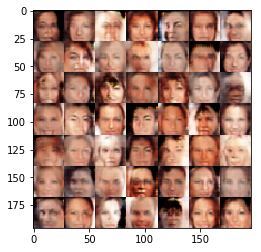

Epoch 1/5... Discriminator Loss: 1.1837... Generator Loss: 1.3767
Epoch 1/5... Discriminator Loss: 1.2722... Generator Loss: 0.6363
Epoch 1/5... Discriminator Loss: 1.3822... Generator Loss: 0.6554
Epoch 1/5... Discriminator Loss: 1.3605... Generator Loss: 2.5212
Epoch 1/5... Discriminator Loss: 1.1489... Generator Loss: 1.8207
Epoch 1/5... Discriminator Loss: 1.2163... Generator Loss: 0.8583
Epoch 1/5... Discriminator Loss: 1.3566... Generator Loss: 1.5343
Epoch 1/5... Discriminator Loss: 1.2595... Generator Loss: 0.7273
Epoch 1/5... Discriminator Loss: 1.2336... Generator Loss: 0.7035
Epoch 1/5... Discriminator Loss: 1.0459... Generator Loss: 1.1595


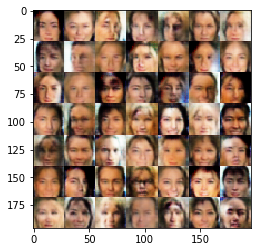

Epoch 1/5... Discriminator Loss: 1.0272... Generator Loss: 1.6754
Epoch 1/5... Discriminator Loss: 1.0224... Generator Loss: 1.7464
Epoch 1/5... Discriminator Loss: 1.1599... Generator Loss: 0.7650
Epoch 1/5... Discriminator Loss: 1.1242... Generator Loss: 0.8460
Epoch 1/5... Discriminator Loss: 1.1355... Generator Loss: 1.6807
Epoch 1/5... Discriminator Loss: 1.0558... Generator Loss: 1.1387
Epoch 1/5... Discriminator Loss: 1.0739... Generator Loss: 1.4671
Epoch 1/5... Discriminator Loss: 1.2882... Generator Loss: 0.6933
Epoch 1/5... Discriminator Loss: 1.2013... Generator Loss: 0.7817
Epoch 1/5... Discriminator Loss: 1.1412... Generator Loss: 0.8416


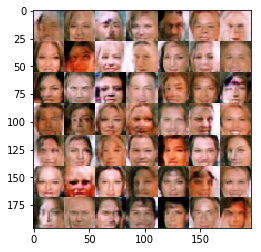

Epoch 1/5... Discriminator Loss: 1.5489... Generator Loss: 0.4825
Epoch 1/5... Discriminator Loss: 1.0978... Generator Loss: 1.0702
Epoch 1/5... Discriminator Loss: 1.1190... Generator Loss: 1.3109
Epoch 1/5... Discriminator Loss: 1.0562... Generator Loss: 0.9884
Epoch 1/5... Discriminator Loss: 1.1870... Generator Loss: 0.6382
Epoch 1/5... Discriminator Loss: 1.6408... Generator Loss: 0.3866
Epoch 1/5... Discriminator Loss: 1.0968... Generator Loss: 1.0715
Epoch 1/5... Discriminator Loss: 0.9585... Generator Loss: 1.2795
Epoch 1/5... Discriminator Loss: 1.1721... Generator Loss: 1.1893
Epoch 1/5... Discriminator Loss: 1.2767... Generator Loss: 1.6873


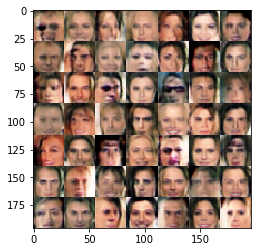

Epoch 1/5... Discriminator Loss: 1.1803... Generator Loss: 0.9076
Epoch 1/5... Discriminator Loss: 1.0496... Generator Loss: 1.1860
Epoch 1/5... Discriminator Loss: 1.0550... Generator Loss: 1.2062
Epoch 1/5... Discriminator Loss: 1.0896... Generator Loss: 1.1157
Epoch 1/5... Discriminator Loss: 1.1727... Generator Loss: 0.8623
Epoch 1/5... Discriminator Loss: 1.1153... Generator Loss: 1.0650
Epoch 1/5... Discriminator Loss: 1.1314... Generator Loss: 0.9438
Epoch 1/5... Discriminator Loss: 1.2249... Generator Loss: 1.3277
Epoch 1/5... Discriminator Loss: 1.2491... Generator Loss: 0.7609
Epoch 1/5... Discriminator Loss: 1.3621... Generator Loss: 1.9832


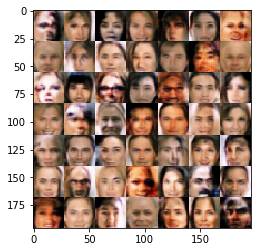

Epoch 1/5... Discriminator Loss: 1.0065... Generator Loss: 1.1422
Epoch 1/5... Discriminator Loss: 1.0847... Generator Loss: 0.9782
Epoch 1/5... Discriminator Loss: 1.0900... Generator Loss: 0.9811
Epoch 1/5... Discriminator Loss: 1.1744... Generator Loss: 1.4940
Epoch 1/5... Discriminator Loss: 1.6636... Generator Loss: 0.4179
Epoch 1/5... Discriminator Loss: 1.0315... Generator Loss: 1.0876
Epoch 1/5... Discriminator Loss: 1.1769... Generator Loss: 0.8939
Epoch 1/5... Discriminator Loss: 1.1059... Generator Loss: 1.0171
Epoch 1/5... Discriminator Loss: 1.0205... Generator Loss: 1.0081
Epoch 1/5... Discriminator Loss: 1.1326... Generator Loss: 1.1076


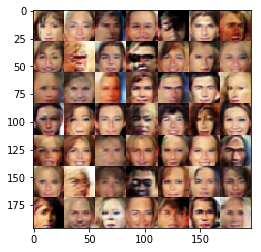

Epoch 1/5... Discriminator Loss: 1.1508... Generator Loss: 1.1163
Epoch 1/5... Discriminator Loss: 1.0652... Generator Loss: 1.3766
Epoch 1/5... Discriminator Loss: 1.4169... Generator Loss: 0.5345
Epoch 1/5... Discriminator Loss: 1.0277... Generator Loss: 1.1639
Epoch 1/5... Discriminator Loss: 1.1651... Generator Loss: 0.7683
Epoch 1/5... Discriminator Loss: 1.0485... Generator Loss: 1.5073
Epoch 1/5... Discriminator Loss: 1.2764... Generator Loss: 0.6879
Epoch 1/5... Discriminator Loss: 1.0645... Generator Loss: 1.6936
Epoch 1/5... Discriminator Loss: 1.1200... Generator Loss: 0.9082
Epoch 1/5... Discriminator Loss: 1.0172... Generator Loss: 1.2524


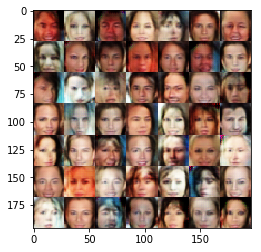

Epoch 1/5... Discriminator Loss: 1.3409... Generator Loss: 1.5180
Epoch 1/5... Discriminator Loss: 1.6839... Generator Loss: 1.8807
Epoch 1/5... Discriminator Loss: 1.1830... Generator Loss: 0.9615
Epoch 1/5... Discriminator Loss: 1.0613... Generator Loss: 0.9938
Epoch 1/5... Discriminator Loss: 0.9899... Generator Loss: 1.0959
Epoch 1/5... Discriminator Loss: 1.1698... Generator Loss: 1.7814
Epoch 1/5... Discriminator Loss: 1.2475... Generator Loss: 0.8355
Epoch 1/5... Discriminator Loss: 1.1283... Generator Loss: 1.4545
Epoch 1/5... Discriminator Loss: 1.0841... Generator Loss: 0.9638
Epoch 1/5... Discriminator Loss: 1.1526... Generator Loss: 0.8352


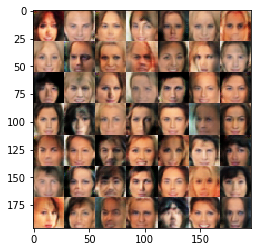

Epoch 1/5... Discriminator Loss: 1.0993... Generator Loss: 0.9760
Epoch 1/5... Discriminator Loss: 1.2269... Generator Loss: 0.8615
Epoch 1/5... Discriminator Loss: 1.1891... Generator Loss: 1.7634
Epoch 1/5... Discriminator Loss: 1.2264... Generator Loss: 0.7588
Epoch 1/5... Discriminator Loss: 1.0234... Generator Loss: 1.0641
Epoch 1/5... Discriminator Loss: 1.1682... Generator Loss: 1.1779
Epoch 1/5... Discriminator Loss: 1.1560... Generator Loss: 0.8873
Epoch 1/5... Discriminator Loss: 1.1252... Generator Loss: 0.9712
Epoch 1/5... Discriminator Loss: 1.3419... Generator Loss: 0.7651
Epoch 1/5... Discriminator Loss: 1.1072... Generator Loss: 0.9488


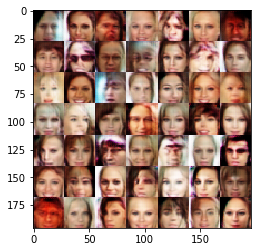

Epoch 1/5... Discriminator Loss: 1.0234... Generator Loss: 1.3778
Epoch 1/5... Discriminator Loss: 1.0176... Generator Loss: 1.3085
Epoch 1/5... Discriminator Loss: 1.0263... Generator Loss: 1.1972
Epoch 1/5... Discriminator Loss: 0.9792... Generator Loss: 1.4136
Epoch 1/5... Discriminator Loss: 1.0166... Generator Loss: 1.0546
Epoch 1/5... Discriminator Loss: 1.0961... Generator Loss: 1.2734
Epoch 1/5... Discriminator Loss: 1.1376... Generator Loss: 1.0284
Epoch 1/5... Discriminator Loss: 1.2524... Generator Loss: 0.7135
Epoch 1/5... Discriminator Loss: 1.1354... Generator Loss: 1.0258
Epoch 1/5... Discriminator Loss: 1.2262... Generator Loss: 0.7886


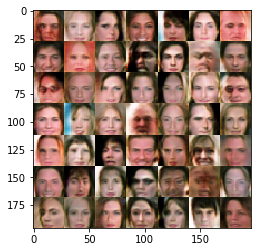

Epoch 1/5... Discriminator Loss: 1.1284... Generator Loss: 1.0965
Epoch 1/5... Discriminator Loss: 1.1429... Generator Loss: 1.1566
Epoch 1/5... Discriminator Loss: 1.1184... Generator Loss: 1.3280
Epoch 1/5... Discriminator Loss: 1.1545... Generator Loss: 0.9453
Epoch 1/5... Discriminator Loss: 1.1462... Generator Loss: 1.0992
Epoch 1/5... Discriminator Loss: 1.1291... Generator Loss: 1.0646
Epoch 1/5... Discriminator Loss: 1.1806... Generator Loss: 0.7922
Epoch 1/5... Discriminator Loss: 1.0002... Generator Loss: 1.5359
Epoch 1/5... Discriminator Loss: 1.1108... Generator Loss: 1.1005
Epoch 1/5... Discriminator Loss: 1.2493... Generator Loss: 1.8251


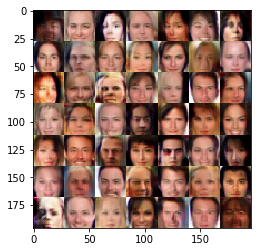

Epoch 1/5... Discriminator Loss: 0.9800... Generator Loss: 1.4753
Epoch 1/5... Discriminator Loss: 1.8088... Generator Loss: 0.3516
Epoch 1/5... Discriminator Loss: 0.9705... Generator Loss: 1.3678
Epoch 1/5... Discriminator Loss: 1.1092... Generator Loss: 1.1765
Epoch 1/5... Discriminator Loss: 1.1929... Generator Loss: 1.4074
Epoch 1/5... Discriminator Loss: 1.0568... Generator Loss: 1.0652
Epoch 1/5... Discriminator Loss: 1.0981... Generator Loss: 0.9154
Epoch 1/5... Discriminator Loss: 1.0570... Generator Loss: 1.1600
Epoch 1/5... Discriminator Loss: 1.2605... Generator Loss: 0.7142
Epoch 1/5... Discriminator Loss: 1.1448... Generator Loss: 0.8476


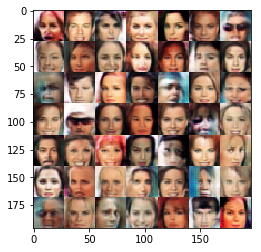

Epoch 1/5... Discriminator Loss: 1.1064... Generator Loss: 1.2664
Epoch 1/5... Discriminator Loss: 1.1272... Generator Loss: 0.8546
Epoch 1/5... Discriminator Loss: 0.9797... Generator Loss: 1.0671
Epoch 1/5... Discriminator Loss: 1.1459... Generator Loss: 1.2068
Epoch 1/5... Discriminator Loss: 1.0553... Generator Loss: 1.4406
Epoch 1/5... Discriminator Loss: 1.0683... Generator Loss: 1.3044
Epoch 1/5... Discriminator Loss: 1.0899... Generator Loss: 1.0361
Epoch 1/5... Discriminator Loss: 1.0131... Generator Loss: 1.0793
Epoch 1/5... Discriminator Loss: 1.1200... Generator Loss: 0.7389
Epoch 1/5... Discriminator Loss: 1.2047... Generator Loss: 1.5475


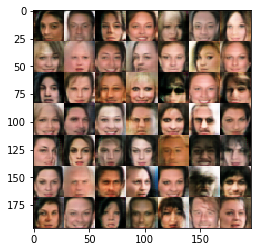

Epoch 1/5... Discriminator Loss: 1.3162... Generator Loss: 1.5862
Epoch 1/5... Discriminator Loss: 0.9443... Generator Loss: 1.5334
Epoch 1/5... Discriminator Loss: 1.3740... Generator Loss: 0.6307
Epoch 1/5... Discriminator Loss: 1.1031... Generator Loss: 1.1164
Epoch 1/5... Discriminator Loss: 1.1373... Generator Loss: 1.1626
Epoch 1/5... Discriminator Loss: 1.1207... Generator Loss: 1.2343
Epoch 1/5... Discriminator Loss: 1.0840... Generator Loss: 1.0800
Epoch 1/5... Discriminator Loss: 1.3579... Generator Loss: 0.6039
Epoch 1/5... Discriminator Loss: 1.0620... Generator Loss: 1.5413
Epoch 1/5... Discriminator Loss: 1.2047... Generator Loss: 0.9535


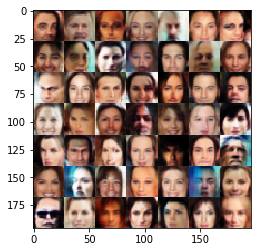

Epoch 1/5... Discriminator Loss: 1.0931... Generator Loss: 1.2804
Epoch 1/5... Discriminator Loss: 1.0401... Generator Loss: 0.9396
Epoch 1/5... Discriminator Loss: 1.2330... Generator Loss: 1.5026
Epoch 1/5... Discriminator Loss: 1.1962... Generator Loss: 1.0287
Epoch 1/5... Discriminator Loss: 1.1307... Generator Loss: 1.1441
Epoch 1/5... Discriminator Loss: 1.2195... Generator Loss: 0.8257
Epoch 1/5... Discriminator Loss: 1.1766... Generator Loss: 1.0232
Epoch 1/5... Discriminator Loss: 1.0705... Generator Loss: 1.2052
Epoch 1/5... Discriminator Loss: 1.0611... Generator Loss: 1.1122
Epoch 1/5... Discriminator Loss: 1.0708... Generator Loss: 1.0509


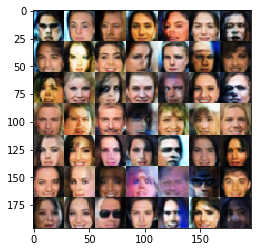

Epoch 1/5... Discriminator Loss: 1.1454... Generator Loss: 1.1664
Epoch 1/5... Discriminator Loss: 1.1711... Generator Loss: 0.8071
Epoch 1/5... Discriminator Loss: 1.0820... Generator Loss: 1.0855
Epoch 1/5... Discriminator Loss: 1.1103... Generator Loss: 1.5109
Epoch 1/5... Discriminator Loss: 0.9805... Generator Loss: 1.2767
Epoch 1/5... Discriminator Loss: 0.9619... Generator Loss: 1.3003
Epoch 1/5... Discriminator Loss: 1.1337... Generator Loss: 1.1168
Epoch 1/5... Discriminator Loss: 0.9951... Generator Loss: 1.1103
Epoch 1/5... Discriminator Loss: 1.1232... Generator Loss: 0.8492
Epoch 1/5... Discriminator Loss: 1.1106... Generator Loss: 1.2860


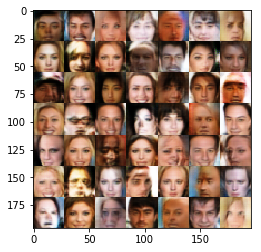

Epoch 1/5... Discriminator Loss: 1.1736... Generator Loss: 1.7304
Epoch 1/5... Discriminator Loss: 1.2247... Generator Loss: 0.7561
Epoch 1/5... Discriminator Loss: 1.1253... Generator Loss: 1.0620
Epoch 1/5... Discriminator Loss: 1.0418... Generator Loss: 1.0287
Epoch 1/5... Discriminator Loss: 1.3195... Generator Loss: 0.7935
Epoch 1/5... Discriminator Loss: 1.1455... Generator Loss: 0.9415
Epoch 1/5... Discriminator Loss: 1.1754... Generator Loss: 1.5186
Epoch 1/5... Discriminator Loss: 1.0647... Generator Loss: 1.1710
Epoch 1/5... Discriminator Loss: 1.0425... Generator Loss: 1.2569
Epoch 1/5... Discriminator Loss: 1.1170... Generator Loss: 1.0931


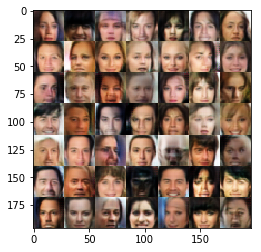

Epoch 1/5... Discriminator Loss: 1.1085... Generator Loss: 1.0266
Epoch 1/5... Discriminator Loss: 1.1391... Generator Loss: 1.0748
Epoch 1/5... Discriminator Loss: 1.1316... Generator Loss: 0.9758
Epoch 1/5... Discriminator Loss: 1.1512... Generator Loss: 0.8763
Epoch 1/5... Discriminator Loss: 1.2060... Generator Loss: 1.3092
Epoch 1/5... Discriminator Loss: 1.1565... Generator Loss: 1.1323
Epoch 1/5... Discriminator Loss: 1.1500... Generator Loss: 1.3354
Epoch 1/5... Discriminator Loss: 1.0879... Generator Loss: 0.9869
Epoch 1/5... Discriminator Loss: 1.1912... Generator Loss: 0.7258
Epoch 1/5... Discriminator Loss: 1.2166... Generator Loss: 0.7753


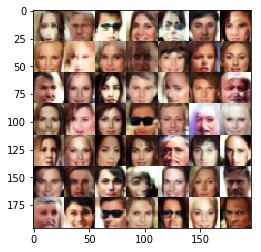

Epoch 1/5... Discriminator Loss: 1.2358... Generator Loss: 1.0847
Epoch 1/5... Discriminator Loss: 1.1143... Generator Loss: 1.0116
Epoch 1/5... Discriminator Loss: 1.1161... Generator Loss: 1.1727
Epoch 1/5... Discriminator Loss: 1.0952... Generator Loss: 1.0193
Epoch 1/5... Discriminator Loss: 1.0969... Generator Loss: 1.3863
Epoch 1/5... Discriminator Loss: 1.1835... Generator Loss: 1.4498
Epoch 1/5... Discriminator Loss: 1.1120... Generator Loss: 1.5835
Epoch 1/5... Discriminator Loss: 1.1317... Generator Loss: 0.9826
Epoch 1/5... Discriminator Loss: 1.1149... Generator Loss: 1.0485
Epoch 1/5... Discriminator Loss: 0.9448... Generator Loss: 1.5819


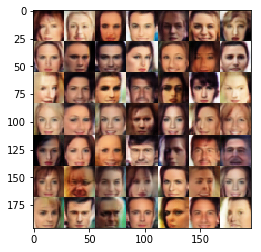

Epoch 1/5... Discriminator Loss: 1.1275... Generator Loss: 0.7897
Epoch 1/5... Discriminator Loss: 1.0361... Generator Loss: 1.1590
Epoch 1/5... Discriminator Loss: 1.1491... Generator Loss: 0.9649
Epoch 1/5... Discriminator Loss: 1.0483... Generator Loss: 1.2039
Epoch 1/5... Discriminator Loss: 1.0816... Generator Loss: 1.1351
Epoch 1/5... Discriminator Loss: 1.1213... Generator Loss: 1.3053
Epoch 1/5... Discriminator Loss: 1.0537... Generator Loss: 0.9303
Epoch 1/5... Discriminator Loss: 1.1040... Generator Loss: 1.3306
Epoch 1/5... Discriminator Loss: 1.1661... Generator Loss: 0.9722
Epoch 1/5... Discriminator Loss: 1.0620... Generator Loss: 1.1239


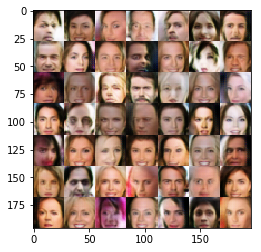

Epoch 1/5... Discriminator Loss: 1.2272... Generator Loss: 1.6044
Epoch 1/5... Discriminator Loss: 1.0343... Generator Loss: 1.5556
Epoch 1/5... Discriminator Loss: 1.0138... Generator Loss: 1.2069
Epoch 1/5... Discriminator Loss: 1.1311... Generator Loss: 1.6349
Epoch 1/5... Discriminator Loss: 1.0973... Generator Loss: 1.2972
Epoch 1/5... Discriminator Loss: 1.0559... Generator Loss: 1.1110
Epoch 1/5... Discriminator Loss: 1.1725... Generator Loss: 1.7965
Epoch 1/5... Discriminator Loss: 1.2163... Generator Loss: 1.5011
Epoch 1/5... Discriminator Loss: 1.1383... Generator Loss: 1.1422
Epoch 1/5... Discriminator Loss: 1.2242... Generator Loss: 0.6600


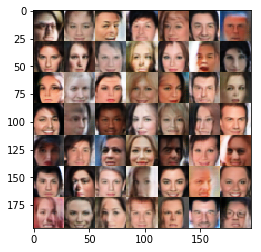

Epoch 1/5... Discriminator Loss: 1.0515... Generator Loss: 1.4368
Epoch 1/5... Discriminator Loss: 1.1085... Generator Loss: 0.9223
Epoch 1/5... Discriminator Loss: 1.0305... Generator Loss: 1.3775
Epoch 1/5... Discriminator Loss: 1.2239... Generator Loss: 0.7363
Epoch 1/5... Discriminator Loss: 1.0165... Generator Loss: 1.1876
Epoch 1/5... Discriminator Loss: 1.2489... Generator Loss: 0.7219
Epoch 1/5... Discriminator Loss: 1.1944... Generator Loss: 0.9053
Epoch 1/5... Discriminator Loss: 0.9509... Generator Loss: 1.1571
Epoch 1/5... Discriminator Loss: 1.0018... Generator Loss: 1.2737
Epoch 1/5... Discriminator Loss: 1.0850... Generator Loss: 1.3045


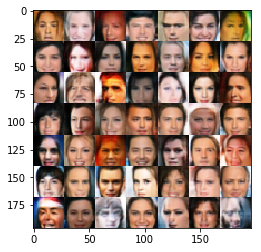

Epoch 1/5... Discriminator Loss: 1.2187... Generator Loss: 0.8796
Epoch 1/5... Discriminator Loss: 1.0604... Generator Loss: 1.0673
Epoch 1/5... Discriminator Loss: 1.0335... Generator Loss: 1.5143
Epoch 1/5... Discriminator Loss: 1.1347... Generator Loss: 1.8767
Epoch 1/5... Discriminator Loss: 1.1604... Generator Loss: 0.7550
Epoch 1/5... Discriminator Loss: 1.2157... Generator Loss: 0.8112
Epoch 2/5... Discriminator Loss: 1.0989... Generator Loss: 1.2741
Epoch 2/5... Discriminator Loss: 1.0440... Generator Loss: 1.1665
Epoch 2/5... Discriminator Loss: 1.1781... Generator Loss: 0.9119
Epoch 2/5... Discriminator Loss: 1.0597... Generator Loss: 1.2659


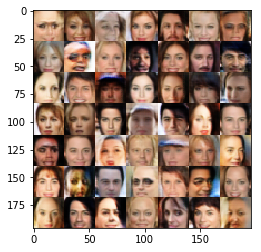

Epoch 2/5... Discriminator Loss: 1.1843... Generator Loss: 0.8267
Epoch 2/5... Discriminator Loss: 1.0873... Generator Loss: 1.3350
Epoch 2/5... Discriminator Loss: 1.0416... Generator Loss: 1.2444
Epoch 2/5... Discriminator Loss: 1.0271... Generator Loss: 1.2001
Epoch 2/5... Discriminator Loss: 1.0968... Generator Loss: 1.2549
Epoch 2/5... Discriminator Loss: 1.1108... Generator Loss: 1.5066
Epoch 2/5... Discriminator Loss: 1.0343... Generator Loss: 1.2158
Epoch 2/5... Discriminator Loss: 1.1528... Generator Loss: 0.8770
Epoch 2/5... Discriminator Loss: 1.1957... Generator Loss: 2.0315
Epoch 2/5... Discriminator Loss: 1.0943... Generator Loss: 1.0788


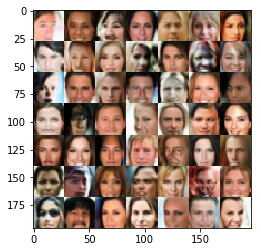

Epoch 2/5... Discriminator Loss: 1.0557... Generator Loss: 1.3242
Epoch 2/5... Discriminator Loss: 1.0827... Generator Loss: 1.2802
Epoch 2/5... Discriminator Loss: 1.2471... Generator Loss: 0.7241
Epoch 2/5... Discriminator Loss: 1.0815... Generator Loss: 1.4075
Epoch 2/5... Discriminator Loss: 1.0912... Generator Loss: 1.7570
Epoch 2/5... Discriminator Loss: 1.0609... Generator Loss: 1.2047
Epoch 2/5... Discriminator Loss: 1.1167... Generator Loss: 1.7365
Epoch 2/5... Discriminator Loss: 1.0034... Generator Loss: 1.4689
Epoch 2/5... Discriminator Loss: 1.0713... Generator Loss: 0.9202
Epoch 2/5... Discriminator Loss: 1.0466... Generator Loss: 1.4983


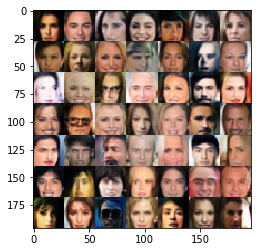

Epoch 2/5... Discriminator Loss: 1.0893... Generator Loss: 1.1715
Epoch 2/5... Discriminator Loss: 0.9724... Generator Loss: 1.4871
Epoch 2/5... Discriminator Loss: 0.9546... Generator Loss: 1.0565
Epoch 2/5... Discriminator Loss: 1.0109... Generator Loss: 1.1724
Epoch 2/5... Discriminator Loss: 0.9646... Generator Loss: 1.2288
Epoch 2/5... Discriminator Loss: 1.1000... Generator Loss: 0.9010
Epoch 2/5... Discriminator Loss: 1.0883... Generator Loss: 0.8839
Epoch 2/5... Discriminator Loss: 1.0862... Generator Loss: 0.9428
Epoch 2/5... Discriminator Loss: 1.1936... Generator Loss: 0.7654
Epoch 2/5... Discriminator Loss: 1.0370... Generator Loss: 1.0490


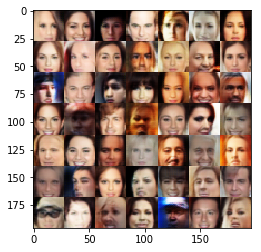

Epoch 2/5... Discriminator Loss: 1.0034... Generator Loss: 1.0276
Epoch 2/5... Discriminator Loss: 1.3169... Generator Loss: 0.6111
Epoch 2/5... Discriminator Loss: 1.2032... Generator Loss: 0.7496
Epoch 2/5... Discriminator Loss: 0.9547... Generator Loss: 1.3088
Epoch 2/5... Discriminator Loss: 1.1697... Generator Loss: 1.7758
Epoch 2/5... Discriminator Loss: 1.0155... Generator Loss: 1.0929
Epoch 2/5... Discriminator Loss: 1.1966... Generator Loss: 0.7272
Epoch 2/5... Discriminator Loss: 1.0546... Generator Loss: 1.4273
Epoch 2/5... Discriminator Loss: 1.0344... Generator Loss: 1.0470
Epoch 2/5... Discriminator Loss: 1.0532... Generator Loss: 1.1918


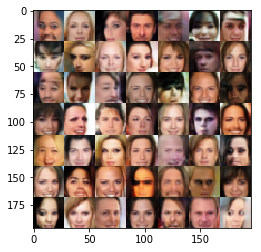

Epoch 2/5... Discriminator Loss: 1.1653... Generator Loss: 0.8439
Epoch 2/5... Discriminator Loss: 1.0236... Generator Loss: 1.6294
Epoch 2/5... Discriminator Loss: 1.2699... Generator Loss: 0.7140
Epoch 2/5... Discriminator Loss: 0.9946... Generator Loss: 1.6077
Epoch 2/5... Discriminator Loss: 1.0401... Generator Loss: 1.1801
Epoch 2/5... Discriminator Loss: 0.9949... Generator Loss: 1.2950
Epoch 2/5... Discriminator Loss: 1.0998... Generator Loss: 1.1477
Epoch 2/5... Discriminator Loss: 1.1062... Generator Loss: 1.4632
Epoch 2/5... Discriminator Loss: 1.0103... Generator Loss: 1.2072
Epoch 2/5... Discriminator Loss: 1.0865... Generator Loss: 1.2027


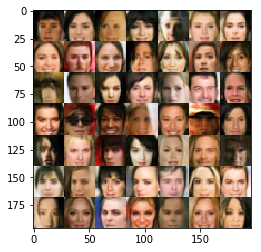

Epoch 2/5... Discriminator Loss: 1.1622... Generator Loss: 1.7665
Epoch 2/5... Discriminator Loss: 1.0576... Generator Loss: 1.0749
Epoch 2/5... Discriminator Loss: 1.1494... Generator Loss: 0.7328
Epoch 2/5... Discriminator Loss: 1.0262... Generator Loss: 1.0595
Epoch 2/5... Discriminator Loss: 1.1131... Generator Loss: 0.8755
Epoch 2/5... Discriminator Loss: 0.9773... Generator Loss: 1.4582
Epoch 2/5... Discriminator Loss: 1.4268... Generator Loss: 0.5638
Epoch 2/5... Discriminator Loss: 1.1830... Generator Loss: 0.7876
Epoch 2/5... Discriminator Loss: 1.0522... Generator Loss: 1.0104
Epoch 2/5... Discriminator Loss: 1.0060... Generator Loss: 1.5121


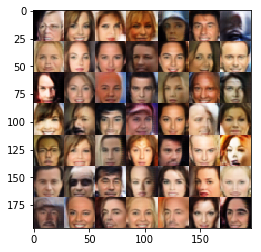

Epoch 2/5... Discriminator Loss: 1.0695... Generator Loss: 1.2792
Epoch 2/5... Discriminator Loss: 1.0628... Generator Loss: 1.3012
Epoch 2/5... Discriminator Loss: 0.9155... Generator Loss: 1.3760
Epoch 2/5... Discriminator Loss: 1.1865... Generator Loss: 0.8295
Epoch 2/5... Discriminator Loss: 1.0485... Generator Loss: 1.0759
Epoch 2/5... Discriminator Loss: 1.1005... Generator Loss: 1.0086
Epoch 2/5... Discriminator Loss: 1.1811... Generator Loss: 1.7108
Epoch 2/5... Discriminator Loss: 0.9724... Generator Loss: 1.3828
Epoch 2/5... Discriminator Loss: 1.1758... Generator Loss: 1.3331
Epoch 2/5... Discriminator Loss: 1.0781... Generator Loss: 0.9089


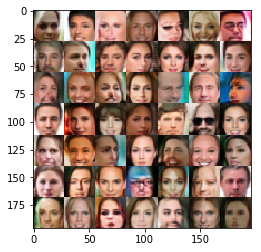

Epoch 2/5... Discriminator Loss: 1.1860... Generator Loss: 1.4355
Epoch 2/5... Discriminator Loss: 1.0128... Generator Loss: 1.1325
Epoch 2/5... Discriminator Loss: 0.9769... Generator Loss: 1.1970
Epoch 2/5... Discriminator Loss: 1.0326... Generator Loss: 1.1003
Epoch 2/5... Discriminator Loss: 0.9937... Generator Loss: 1.3127
Epoch 2/5... Discriminator Loss: 1.0083... Generator Loss: 1.6596
Epoch 2/5... Discriminator Loss: 1.0004... Generator Loss: 1.2143
Epoch 2/5... Discriminator Loss: 1.1268... Generator Loss: 0.8062
Epoch 2/5... Discriminator Loss: 1.3685... Generator Loss: 1.9691
Epoch 2/5... Discriminator Loss: 1.1081... Generator Loss: 1.6723


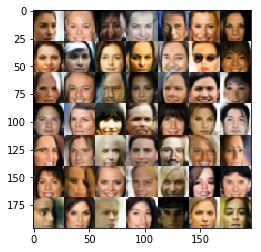

Epoch 2/5... Discriminator Loss: 1.1048... Generator Loss: 1.3888
Epoch 2/5... Discriminator Loss: 1.0444... Generator Loss: 1.2683
Epoch 2/5... Discriminator Loss: 1.1859... Generator Loss: 0.8327
Epoch 2/5... Discriminator Loss: 1.0053... Generator Loss: 1.7365
Epoch 2/5... Discriminator Loss: 1.0170... Generator Loss: 1.2053
Epoch 2/5... Discriminator Loss: 0.9996... Generator Loss: 1.0270
Epoch 2/5... Discriminator Loss: 0.9889... Generator Loss: 1.2076
Epoch 2/5... Discriminator Loss: 1.1120... Generator Loss: 0.8355
Epoch 2/5... Discriminator Loss: 0.9508... Generator Loss: 1.5056
Epoch 2/5... Discriminator Loss: 1.0326... Generator Loss: 1.8007


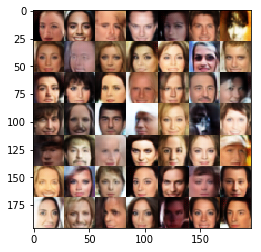

Epoch 2/5... Discriminator Loss: 1.0648... Generator Loss: 1.2175
Epoch 2/5... Discriminator Loss: 1.0226... Generator Loss: 1.5055
Epoch 2/5... Discriminator Loss: 0.9381... Generator Loss: 1.4747
Epoch 2/5... Discriminator Loss: 1.1213... Generator Loss: 1.2238
Epoch 2/5... Discriminator Loss: 1.1193... Generator Loss: 0.7075
Epoch 2/5... Discriminator Loss: 0.9840... Generator Loss: 1.2797
Epoch 2/5... Discriminator Loss: 1.0454... Generator Loss: 0.9912
Epoch 2/5... Discriminator Loss: 1.0770... Generator Loss: 0.8581
Epoch 2/5... Discriminator Loss: 0.9265... Generator Loss: 1.3098
Epoch 2/5... Discriminator Loss: 1.0253... Generator Loss: 1.1476


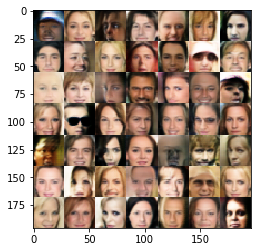

Epoch 2/5... Discriminator Loss: 1.0912... Generator Loss: 0.9085
Epoch 2/5... Discriminator Loss: 1.1195... Generator Loss: 1.3507
Epoch 2/5... Discriminator Loss: 1.1505... Generator Loss: 0.7931
Epoch 2/5... Discriminator Loss: 1.0061... Generator Loss: 1.3547
Epoch 2/5... Discriminator Loss: 1.0873... Generator Loss: 1.7615
Epoch 2/5... Discriminator Loss: 0.9949... Generator Loss: 1.4215
Epoch 2/5... Discriminator Loss: 1.0059... Generator Loss: 1.9830
Epoch 2/5... Discriminator Loss: 1.0202... Generator Loss: 1.4880
Epoch 2/5... Discriminator Loss: 1.1133... Generator Loss: 0.9000
Epoch 2/5... Discriminator Loss: 0.9328... Generator Loss: 1.2863


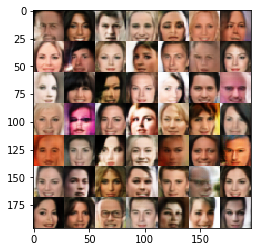

Epoch 2/5... Discriminator Loss: 0.9567... Generator Loss: 1.5618
Epoch 2/5... Discriminator Loss: 1.0143... Generator Loss: 1.3734
Epoch 2/5... Discriminator Loss: 1.0200... Generator Loss: 1.1586
Epoch 2/5... Discriminator Loss: 0.9310... Generator Loss: 1.4383
Epoch 2/5... Discriminator Loss: 1.2759... Generator Loss: 0.7001
Epoch 2/5... Discriminator Loss: 0.9656... Generator Loss: 1.2095
Epoch 2/5... Discriminator Loss: 0.9047... Generator Loss: 1.9123
Epoch 2/5... Discriminator Loss: 0.9978... Generator Loss: 0.9394
Epoch 2/5... Discriminator Loss: 1.1682... Generator Loss: 0.7897
Epoch 2/5... Discriminator Loss: 0.9890... Generator Loss: 1.1646


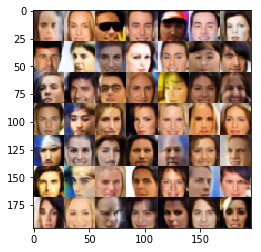

Epoch 2/5... Discriminator Loss: 0.9777... Generator Loss: 1.5942
Epoch 2/5... Discriminator Loss: 1.0321... Generator Loss: 1.0836
Epoch 2/5... Discriminator Loss: 0.8316... Generator Loss: 1.8640
Epoch 2/5... Discriminator Loss: 0.9746... Generator Loss: 1.7427
Epoch 2/5... Discriminator Loss: 0.9053... Generator Loss: 1.6245
Epoch 2/5... Discriminator Loss: 0.9130... Generator Loss: 1.0466
Epoch 2/5... Discriminator Loss: 0.9685... Generator Loss: 1.2861
Epoch 2/5... Discriminator Loss: 0.9971... Generator Loss: 1.7341
Epoch 2/5... Discriminator Loss: 1.2336... Generator Loss: 0.7512
Epoch 2/5... Discriminator Loss: 1.0872... Generator Loss: 1.0034


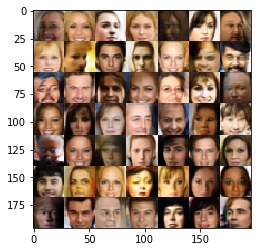

Epoch 2/5... Discriminator Loss: 1.4419... Generator Loss: 2.5471
Epoch 2/5... Discriminator Loss: 0.9068... Generator Loss: 1.5405
Epoch 2/5... Discriminator Loss: 0.9579... Generator Loss: 1.0822
Epoch 2/5... Discriminator Loss: 1.0152... Generator Loss: 1.0226
Epoch 2/5... Discriminator Loss: 0.9468... Generator Loss: 1.1486
Epoch 2/5... Discriminator Loss: 1.0863... Generator Loss: 0.9377
Epoch 2/5... Discriminator Loss: 1.0448... Generator Loss: 1.1955
Epoch 2/5... Discriminator Loss: 1.0509... Generator Loss: 1.2974
Epoch 2/5... Discriminator Loss: 0.9493... Generator Loss: 1.2579
Epoch 2/5... Discriminator Loss: 1.0176... Generator Loss: 0.9887


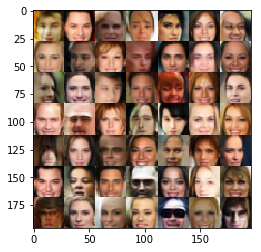

Epoch 2/5... Discriminator Loss: 1.0715... Generator Loss: 1.6338
Epoch 2/5... Discriminator Loss: 1.1608... Generator Loss: 0.8576
Epoch 2/5... Discriminator Loss: 0.9611... Generator Loss: 2.0299
Epoch 2/5... Discriminator Loss: 1.0599... Generator Loss: 2.1682
Epoch 2/5... Discriminator Loss: 0.9812... Generator Loss: 1.3411
Epoch 2/5... Discriminator Loss: 1.0649... Generator Loss: 1.8010
Epoch 2/5... Discriminator Loss: 0.9552... Generator Loss: 1.8049
Epoch 2/5... Discriminator Loss: 0.9222... Generator Loss: 1.1609
Epoch 2/5... Discriminator Loss: 1.0520... Generator Loss: 1.6482
Epoch 2/5... Discriminator Loss: 0.8679... Generator Loss: 1.3836


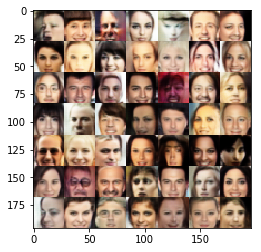

Epoch 2/5... Discriminator Loss: 0.9304... Generator Loss: 1.2209
Epoch 2/5... Discriminator Loss: 1.0568... Generator Loss: 1.4270
Epoch 2/5... Discriminator Loss: 0.9763... Generator Loss: 1.0784
Epoch 2/5... Discriminator Loss: 0.9089... Generator Loss: 1.4008
Epoch 2/5... Discriminator Loss: 0.9767... Generator Loss: 1.1982
Epoch 2/5... Discriminator Loss: 1.0209... Generator Loss: 1.1221
Epoch 2/5... Discriminator Loss: 0.9086... Generator Loss: 1.2667
Epoch 2/5... Discriminator Loss: 0.9334... Generator Loss: 1.3454
Epoch 2/5... Discriminator Loss: 1.0845... Generator Loss: 0.9076
Epoch 2/5... Discriminator Loss: 1.0329... Generator Loss: 1.1701


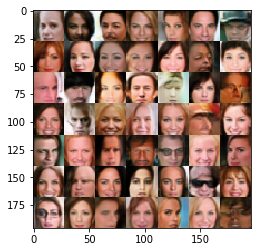

Epoch 2/5... Discriminator Loss: 0.9627... Generator Loss: 1.3649
Epoch 2/5... Discriminator Loss: 0.8892... Generator Loss: 1.3058
Epoch 2/5... Discriminator Loss: 0.8796... Generator Loss: 1.2662
Epoch 2/5... Discriminator Loss: 0.8965... Generator Loss: 1.4719
Epoch 2/5... Discriminator Loss: 0.8790... Generator Loss: 1.1997
Epoch 2/5... Discriminator Loss: 0.9803... Generator Loss: 1.3681
Epoch 2/5... Discriminator Loss: 0.9127... Generator Loss: 1.5927
Epoch 2/5... Discriminator Loss: 0.9963... Generator Loss: 1.2925
Epoch 2/5... Discriminator Loss: 0.8853... Generator Loss: 1.3968
Epoch 2/5... Discriminator Loss: 1.1336... Generator Loss: 1.5853


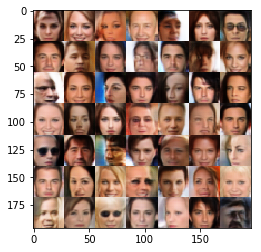

Epoch 2/5... Discriminator Loss: 0.9221... Generator Loss: 1.6939
Epoch 2/5... Discriminator Loss: 1.0471... Generator Loss: 0.9743
Epoch 2/5... Discriminator Loss: 1.0137... Generator Loss: 1.3212
Epoch 2/5... Discriminator Loss: 1.1987... Generator Loss: 0.8084
Epoch 2/5... Discriminator Loss: 1.0684... Generator Loss: 0.8985
Epoch 2/5... Discriminator Loss: 1.0125... Generator Loss: 0.9316
Epoch 2/5... Discriminator Loss: 0.8803... Generator Loss: 1.5077
Epoch 2/5... Discriminator Loss: 0.9506... Generator Loss: 1.8349
Epoch 2/5... Discriminator Loss: 1.0427... Generator Loss: 0.8393
Epoch 2/5... Discriminator Loss: 0.9955... Generator Loss: 1.0492


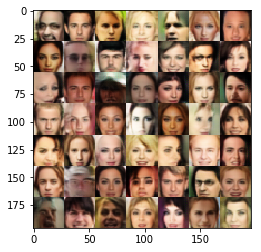

Epoch 2/5... Discriminator Loss: 0.8987... Generator Loss: 1.1003
Epoch 2/5... Discriminator Loss: 1.0923... Generator Loss: 1.8411
Epoch 2/5... Discriminator Loss: 1.1229... Generator Loss: 0.9460
Epoch 2/5... Discriminator Loss: 0.8905... Generator Loss: 1.3004
Epoch 2/5... Discriminator Loss: 0.9330... Generator Loss: 1.8637
Epoch 2/5... Discriminator Loss: 0.9558... Generator Loss: 1.6781
Epoch 2/5... Discriminator Loss: 0.9610... Generator Loss: 1.8620
Epoch 2/5... Discriminator Loss: 0.9988... Generator Loss: 1.5573
Epoch 2/5... Discriminator Loss: 0.9024... Generator Loss: 1.4072
Epoch 2/5... Discriminator Loss: 1.4880... Generator Loss: 2.4152


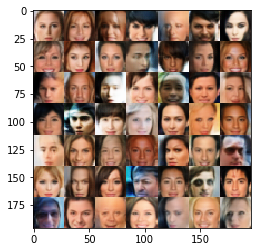

Epoch 2/5... Discriminator Loss: 0.9733... Generator Loss: 1.5350
Epoch 2/5... Discriminator Loss: 1.1344... Generator Loss: 1.1667
Epoch 2/5... Discriminator Loss: 0.8486... Generator Loss: 1.7801
Epoch 2/5... Discriminator Loss: 0.8385... Generator Loss: 1.3518
Epoch 2/5... Discriminator Loss: 0.9993... Generator Loss: 1.3054
Epoch 2/5... Discriminator Loss: 0.9051... Generator Loss: 1.3331
Epoch 2/5... Discriminator Loss: 0.9450... Generator Loss: 1.0502
Epoch 2/5... Discriminator Loss: 0.8470... Generator Loss: 1.3368
Epoch 2/5... Discriminator Loss: 0.9374... Generator Loss: 1.1381
Epoch 2/5... Discriminator Loss: 1.0828... Generator Loss: 1.0121


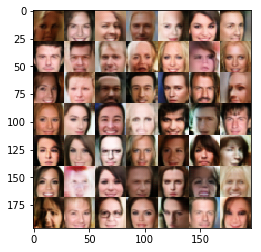

Epoch 2/5... Discriminator Loss: 1.0888... Generator Loss: 0.8468
Epoch 2/5... Discriminator Loss: 0.9552... Generator Loss: 1.2108
Epoch 2/5... Discriminator Loss: 1.1695... Generator Loss: 2.0332
Epoch 2/5... Discriminator Loss: 0.9369... Generator Loss: 1.4259
Epoch 2/5... Discriminator Loss: 0.8567... Generator Loss: 1.7875
Epoch 2/5... Discriminator Loss: 0.9645... Generator Loss: 1.2545
Epoch 2/5... Discriminator Loss: 0.7977... Generator Loss: 2.0711
Epoch 2/5... Discriminator Loss: 0.8825... Generator Loss: 1.5727
Epoch 2/5... Discriminator Loss: 0.6927... Generator Loss: 2.1785
Epoch 2/5... Discriminator Loss: 0.8788... Generator Loss: 1.3861


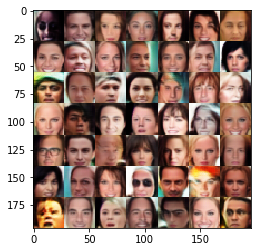

Epoch 2/5... Discriminator Loss: 0.8806... Generator Loss: 1.8245
Epoch 2/5... Discriminator Loss: 0.8734... Generator Loss: 1.5688
Epoch 2/5... Discriminator Loss: 0.8490... Generator Loss: 1.4645
Epoch 2/5... Discriminator Loss: 0.8764... Generator Loss: 1.3904
Epoch 2/5... Discriminator Loss: 1.0611... Generator Loss: 0.9665
Epoch 2/5... Discriminator Loss: 0.9251... Generator Loss: 1.1616
Epoch 2/5... Discriminator Loss: 0.9340... Generator Loss: 1.3724
Epoch 2/5... Discriminator Loss: 1.1386... Generator Loss: 0.7887
Epoch 2/5... Discriminator Loss: 0.9320... Generator Loss: 1.0886
Epoch 2/5... Discriminator Loss: 0.7473... Generator Loss: 1.4883


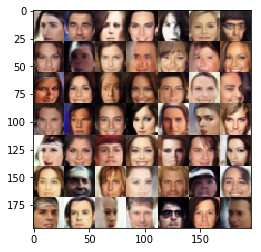

Epoch 2/5... Discriminator Loss: 1.3580... Generator Loss: 0.6093
Epoch 2/5... Discriminator Loss: 1.1518... Generator Loss: 0.8563
Epoch 2/5... Discriminator Loss: 0.9540... Generator Loss: 1.5632
Epoch 2/5... Discriminator Loss: 0.8354... Generator Loss: 1.7249
Epoch 2/5... Discriminator Loss: 0.9150... Generator Loss: 2.3198
Epoch 2/5... Discriminator Loss: 0.8656... Generator Loss: 1.3676
Epoch 2/5... Discriminator Loss: 0.9373... Generator Loss: 1.4444
Epoch 2/5... Discriminator Loss: 0.7738... Generator Loss: 1.8713
Epoch 2/5... Discriminator Loss: 0.8251... Generator Loss: 1.8163
Epoch 2/5... Discriminator Loss: 1.0149... Generator Loss: 2.2033


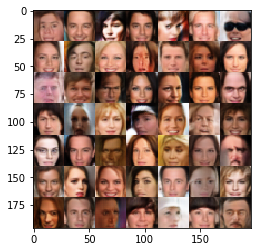

Epoch 2/5... Discriminator Loss: 0.9130... Generator Loss: 2.5998
Epoch 2/5... Discriminator Loss: 0.8301... Generator Loss: 1.8712
Epoch 2/5... Discriminator Loss: 1.0037... Generator Loss: 1.1395
Epoch 2/5... Discriminator Loss: 0.9527... Generator Loss: 1.0563
Epoch 2/5... Discriminator Loss: 0.8198... Generator Loss: 1.5688
Epoch 2/5... Discriminator Loss: 0.9356... Generator Loss: 1.6590
Epoch 2/5... Discriminator Loss: 0.9249... Generator Loss: 1.3118
Epoch 2/5... Discriminator Loss: 0.9198... Generator Loss: 1.2190
Epoch 2/5... Discriminator Loss: 0.9365... Generator Loss: 1.5356
Epoch 2/5... Discriminator Loss: 1.2233... Generator Loss: 1.5899


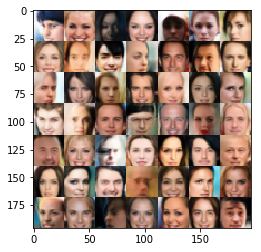

Epoch 2/5... Discriminator Loss: 0.9732... Generator Loss: 2.0711
Epoch 2/5... Discriminator Loss: 0.9931... Generator Loss: 1.5346
Epoch 2/5... Discriminator Loss: 0.8072... Generator Loss: 1.6749
Epoch 2/5... Discriminator Loss: 0.8436... Generator Loss: 1.8066
Epoch 2/5... Discriminator Loss: 0.9928... Generator Loss: 1.5900
Epoch 2/5... Discriminator Loss: 1.0958... Generator Loss: 0.8337
Epoch 2/5... Discriminator Loss: 0.8923... Generator Loss: 1.3594
Epoch 2/5... Discriminator Loss: 1.0145... Generator Loss: 1.1427
Epoch 2/5... Discriminator Loss: 0.9038... Generator Loss: 1.8309
Epoch 2/5... Discriminator Loss: 0.9576... Generator Loss: 1.1437


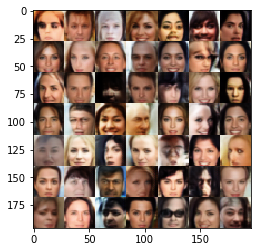

Epoch 2/5... Discriminator Loss: 0.9089... Generator Loss: 1.5074
Epoch 2/5... Discriminator Loss: 0.8807... Generator Loss: 2.0347
Epoch 2/5... Discriminator Loss: 0.9882... Generator Loss: 0.9877
Epoch 2/5... Discriminator Loss: 0.8803... Generator Loss: 1.7002
Epoch 2/5... Discriminator Loss: 0.9153... Generator Loss: 1.5649
Epoch 2/5... Discriminator Loss: 1.0586... Generator Loss: 2.1768
Epoch 2/5... Discriminator Loss: 1.0266... Generator Loss: 0.9931
Epoch 2/5... Discriminator Loss: 0.7913... Generator Loss: 1.7028
Epoch 2/5... Discriminator Loss: 0.8718... Generator Loss: 1.7527
Epoch 2/5... Discriminator Loss: 0.7680... Generator Loss: 1.5971


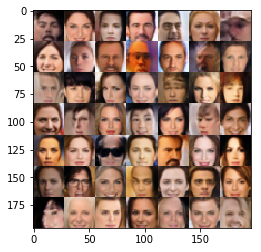

Epoch 2/5... Discriminator Loss: 0.8123... Generator Loss: 2.1996
Epoch 2/5... Discriminator Loss: 0.9312... Generator Loss: 1.9920
Epoch 2/5... Discriminator Loss: 0.8927... Generator Loss: 1.1750
Epoch 2/5... Discriminator Loss: 0.8294... Generator Loss: 1.5411
Epoch 2/5... Discriminator Loss: 0.9045... Generator Loss: 1.2362
Epoch 2/5... Discriminator Loss: 1.0089... Generator Loss: 1.2427
Epoch 2/5... Discriminator Loss: 0.8457... Generator Loss: 1.8314
Epoch 2/5... Discriminator Loss: 0.9330... Generator Loss: 1.6252
Epoch 2/5... Discriminator Loss: 1.1464... Generator Loss: 0.9232
Epoch 2/5... Discriminator Loss: 1.2070... Generator Loss: 0.8044


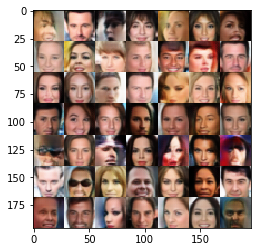

Epoch 2/5... Discriminator Loss: 0.9106... Generator Loss: 2.0587
Epoch 2/5... Discriminator Loss: 0.9917... Generator Loss: 1.1702
Epoch 2/5... Discriminator Loss: 1.0130... Generator Loss: 1.0671
Epoch 2/5... Discriminator Loss: 0.9300... Generator Loss: 1.7937
Epoch 2/5... Discriminator Loss: 0.7976... Generator Loss: 1.7007
Epoch 2/5... Discriminator Loss: 1.1411... Generator Loss: 2.3310
Epoch 2/5... Discriminator Loss: 1.1648... Generator Loss: 1.0761
Epoch 2/5... Discriminator Loss: 0.9222... Generator Loss: 1.1584
Epoch 2/5... Discriminator Loss: 0.9277... Generator Loss: 1.6123
Epoch 2/5... Discriminator Loss: 1.0478... Generator Loss: 1.1295


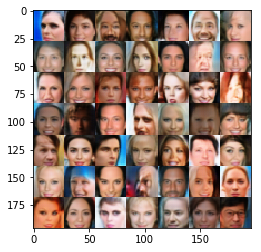

Epoch 2/5... Discriminator Loss: 0.9952... Generator Loss: 1.5486
Epoch 2/5... Discriminator Loss: 0.9318... Generator Loss: 1.1119
Epoch 2/5... Discriminator Loss: 0.8894... Generator Loss: 1.3937
Epoch 2/5... Discriminator Loss: 1.1338... Generator Loss: 0.9620
Epoch 2/5... Discriminator Loss: 0.8341... Generator Loss: 1.9761
Epoch 2/5... Discriminator Loss: 0.8441... Generator Loss: 1.4954
Epoch 2/5... Discriminator Loss: 0.7713... Generator Loss: 1.5616
Epoch 2/5... Discriminator Loss: 1.1010... Generator Loss: 2.5763
Epoch 2/5... Discriminator Loss: 0.8910... Generator Loss: 1.6952
Epoch 2/5... Discriminator Loss: 0.9071... Generator Loss: 1.2869


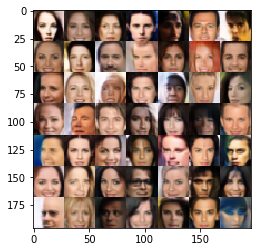

Epoch 2/5... Discriminator Loss: 1.2047... Generator Loss: 0.7451
Epoch 2/5... Discriminator Loss: 0.8037... Generator Loss: 1.9470
Epoch 2/5... Discriminator Loss: 0.7012... Generator Loss: 1.6397
Epoch 2/5... Discriminator Loss: 0.8670... Generator Loss: 1.5457
Epoch 2/5... Discriminator Loss: 0.8704... Generator Loss: 1.4076
Epoch 2/5... Discriminator Loss: 1.0160... Generator Loss: 0.8822
Epoch 2/5... Discriminator Loss: 0.7525... Generator Loss: 1.7187
Epoch 2/5... Discriminator Loss: 0.7703... Generator Loss: 2.0815
Epoch 2/5... Discriminator Loss: 0.9540... Generator Loss: 1.3032
Epoch 2/5... Discriminator Loss: 0.8308... Generator Loss: 2.1921


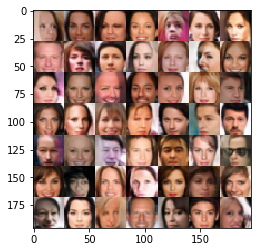

Epoch 2/5... Discriminator Loss: 0.9317... Generator Loss: 1.1499
Epoch 2/5... Discriminator Loss: 0.8046... Generator Loss: 1.3995
Epoch 2/5... Discriminator Loss: 0.8270... Generator Loss: 1.3719
Epoch 2/5... Discriminator Loss: 0.8932... Generator Loss: 1.9507
Epoch 2/5... Discriminator Loss: 0.8658... Generator Loss: 1.3840
Epoch 2/5... Discriminator Loss: 0.7609... Generator Loss: 2.2761
Epoch 2/5... Discriminator Loss: 0.8738... Generator Loss: 1.8491
Epoch 2/5... Discriminator Loss: 0.8889... Generator Loss: 1.7432
Epoch 2/5... Discriminator Loss: 0.7833... Generator Loss: 1.9410
Epoch 2/5... Discriminator Loss: 0.8617... Generator Loss: 1.6773


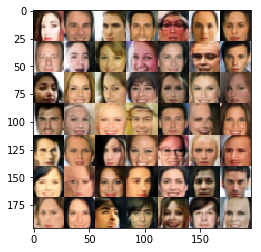

Epoch 2/5... Discriminator Loss: 0.8490... Generator Loss: 2.2541
Epoch 2/5... Discriminator Loss: 0.7293... Generator Loss: 1.5976
Epoch 2/5... Discriminator Loss: 0.7428... Generator Loss: 2.0014
Epoch 3/5... Discriminator Loss: 0.7531... Generator Loss: 1.6341
Epoch 3/5... Discriminator Loss: 0.8918... Generator Loss: 2.6312
Epoch 3/5... Discriminator Loss: 0.7784... Generator Loss: 2.1538
Epoch 3/5... Discriminator Loss: 0.8749... Generator Loss: 1.6503
Epoch 3/5... Discriminator Loss: 0.7756... Generator Loss: 2.0431
Epoch 3/5... Discriminator Loss: 0.7960... Generator Loss: 1.7768
Epoch 3/5... Discriminator Loss: 1.0752... Generator Loss: 1.9108


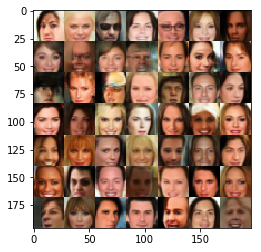

Epoch 3/5... Discriminator Loss: 0.9754... Generator Loss: 2.2302
Epoch 3/5... Discriminator Loss: 0.8049... Generator Loss: 1.6915
Epoch 3/5... Discriminator Loss: 0.6771... Generator Loss: 1.8176
Epoch 3/5... Discriminator Loss: 0.9159... Generator Loss: 1.3134
Epoch 3/5... Discriminator Loss: 0.8417... Generator Loss: 1.8286
Epoch 3/5... Discriminator Loss: 0.7672... Generator Loss: 1.5325
Epoch 3/5... Discriminator Loss: 1.0658... Generator Loss: 0.9451
Epoch 3/5... Discriminator Loss: 0.9122... Generator Loss: 1.0641
Epoch 3/5... Discriminator Loss: 0.9925... Generator Loss: 2.0946
Epoch 3/5... Discriminator Loss: 0.9436... Generator Loss: 2.4996


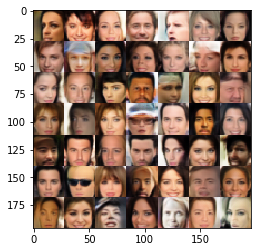

Epoch 3/5... Discriminator Loss: 0.7758... Generator Loss: 1.6124
Epoch 3/5... Discriminator Loss: 0.8982... Generator Loss: 1.5248
Epoch 3/5... Discriminator Loss: 0.7510... Generator Loss: 1.9949
Epoch 3/5... Discriminator Loss: 0.9316... Generator Loss: 2.1631
Epoch 3/5... Discriminator Loss: 0.9783... Generator Loss: 1.1158
Epoch 3/5... Discriminator Loss: 1.1336... Generator Loss: 0.9740
Epoch 3/5... Discriminator Loss: 0.8716... Generator Loss: 1.4273
Epoch 3/5... Discriminator Loss: 1.0740... Generator Loss: 3.0842
Epoch 3/5... Discriminator Loss: 0.9798... Generator Loss: 1.0800
Epoch 3/5... Discriminator Loss: 0.8987... Generator Loss: 1.3673


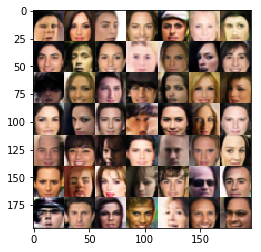

Epoch 3/5... Discriminator Loss: 1.1206... Generator Loss: 0.9623
Epoch 3/5... Discriminator Loss: 0.7737... Generator Loss: 1.9896
Epoch 3/5... Discriminator Loss: 0.8982... Generator Loss: 1.3157
Epoch 3/5... Discriminator Loss: 0.8193... Generator Loss: 2.2683
Epoch 3/5... Discriminator Loss: 0.8605... Generator Loss: 1.3905
Epoch 3/5... Discriminator Loss: 1.1298... Generator Loss: 1.7639
Epoch 3/5... Discriminator Loss: 0.9772... Generator Loss: 1.8033
Epoch 3/5... Discriminator Loss: 0.8959... Generator Loss: 1.6825
Epoch 3/5... Discriminator Loss: 0.7314... Generator Loss: 2.0539
Epoch 3/5... Discriminator Loss: 0.8509... Generator Loss: 1.7182


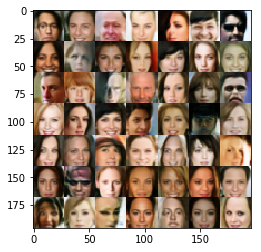

Epoch 3/5... Discriminator Loss: 0.9232... Generator Loss: 2.2219
Epoch 3/5... Discriminator Loss: 0.9053... Generator Loss: 1.3221
Epoch 3/5... Discriminator Loss: 1.0836... Generator Loss: 1.0608
Epoch 3/5... Discriminator Loss: 0.9275... Generator Loss: 1.3652
Epoch 3/5... Discriminator Loss: 0.8397... Generator Loss: 2.0085
Epoch 3/5... Discriminator Loss: 0.8801... Generator Loss: 1.3661
Epoch 3/5... Discriminator Loss: 1.0714... Generator Loss: 0.8491
Epoch 3/5... Discriminator Loss: 1.1025... Generator Loss: 0.7933
Epoch 3/5... Discriminator Loss: 0.8094... Generator Loss: 1.6689
Epoch 3/5... Discriminator Loss: 0.6917... Generator Loss: 2.0466


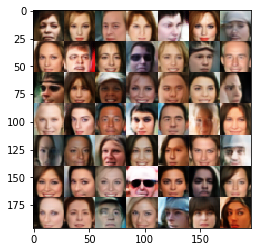

Epoch 3/5... Discriminator Loss: 0.7352... Generator Loss: 2.0665
Epoch 3/5... Discriminator Loss: 0.8154... Generator Loss: 2.0693
Epoch 3/5... Discriminator Loss: 0.7933... Generator Loss: 1.4673
Epoch 3/5... Discriminator Loss: 1.0580... Generator Loss: 0.9456
Epoch 3/5... Discriminator Loss: 1.0277... Generator Loss: 1.1955
Epoch 3/5... Discriminator Loss: 0.8496... Generator Loss: 1.7638
Epoch 3/5... Discriminator Loss: 0.8831... Generator Loss: 1.4757
Epoch 3/5... Discriminator Loss: 1.0321... Generator Loss: 2.2506
Epoch 3/5... Discriminator Loss: 0.9241... Generator Loss: 2.3715
Epoch 3/5... Discriminator Loss: 0.8103... Generator Loss: 1.5857


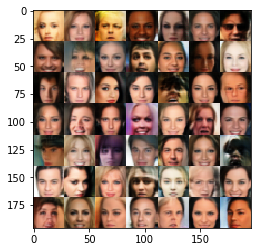

Epoch 3/5... Discriminator Loss: 0.8230... Generator Loss: 1.5688
Epoch 3/5... Discriminator Loss: 0.8944... Generator Loss: 1.2114
Epoch 3/5... Discriminator Loss: 0.7884... Generator Loss: 2.2038
Epoch 3/5... Discriminator Loss: 0.9900... Generator Loss: 1.1948
Epoch 3/5... Discriminator Loss: 1.0061... Generator Loss: 1.0750
Epoch 3/5... Discriminator Loss: 0.9186... Generator Loss: 1.4059
Epoch 3/5... Discriminator Loss: 0.8159... Generator Loss: 1.6305
Epoch 3/5... Discriminator Loss: 0.7863... Generator Loss: 1.8341
Epoch 3/5... Discriminator Loss: 0.7945... Generator Loss: 1.4848
Epoch 3/5... Discriminator Loss: 0.9600... Generator Loss: 1.2422


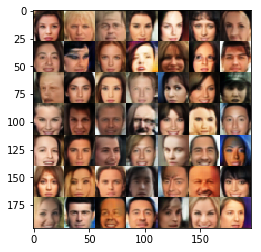

Epoch 3/5... Discriminator Loss: 0.7927... Generator Loss: 2.0854
Epoch 3/5... Discriminator Loss: 0.9999... Generator Loss: 1.1301
Epoch 3/5... Discriminator Loss: 0.9446... Generator Loss: 1.4983
Epoch 3/5... Discriminator Loss: 1.0030... Generator Loss: 1.3624
Epoch 3/5... Discriminator Loss: 0.8945... Generator Loss: 1.4796
Epoch 3/5... Discriminator Loss: 0.9810... Generator Loss: 1.1267
Epoch 3/5... Discriminator Loss: 0.8645... Generator Loss: 2.7317
Epoch 3/5... Discriminator Loss: 0.6963... Generator Loss: 1.8936
Epoch 3/5... Discriminator Loss: 0.7947... Generator Loss: 1.7516
Epoch 3/5... Discriminator Loss: 1.0019... Generator Loss: 1.1454


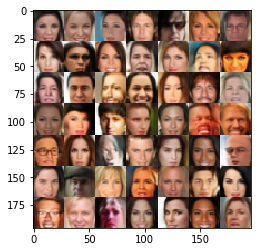

Epoch 3/5... Discriminator Loss: 0.7934... Generator Loss: 2.0420
Epoch 3/5... Discriminator Loss: 0.8059... Generator Loss: 2.0086
Epoch 3/5... Discriminator Loss: 0.8521... Generator Loss: 2.2817
Epoch 3/5... Discriminator Loss: 0.7571... Generator Loss: 1.5747
Epoch 3/5... Discriminator Loss: 0.9958... Generator Loss: 1.1277
Epoch 3/5... Discriminator Loss: 1.0174... Generator Loss: 1.0542
Epoch 3/5... Discriminator Loss: 0.9493... Generator Loss: 1.3399
Epoch 3/5... Discriminator Loss: 0.6846... Generator Loss: 2.0157
Epoch 3/5... Discriminator Loss: 1.2323... Generator Loss: 0.8914
Epoch 3/5... Discriminator Loss: 0.9036... Generator Loss: 2.0704


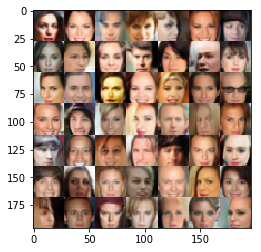

Epoch 3/5... Discriminator Loss: 0.8206... Generator Loss: 1.8044
Epoch 3/5... Discriminator Loss: 1.2034... Generator Loss: 2.7621
Epoch 3/5... Discriminator Loss: 0.8137... Generator Loss: 1.5312
Epoch 3/5... Discriminator Loss: 0.7847... Generator Loss: 1.6158
Epoch 3/5... Discriminator Loss: 0.9613... Generator Loss: 1.2131
Epoch 3/5... Discriminator Loss: 0.8360... Generator Loss: 1.4301
Epoch 3/5... Discriminator Loss: 0.6672... Generator Loss: 2.6495
Epoch 3/5... Discriminator Loss: 0.8913... Generator Loss: 1.2897
Epoch 3/5... Discriminator Loss: 0.9174... Generator Loss: 2.9335
Epoch 3/5... Discriminator Loss: 0.6812... Generator Loss: 1.8404


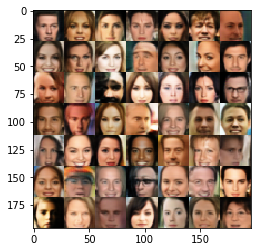

Epoch 3/5... Discriminator Loss: 1.4285... Generator Loss: 0.7762
Epoch 3/5... Discriminator Loss: 0.9306... Generator Loss: 1.5967
Epoch 3/5... Discriminator Loss: 0.8998... Generator Loss: 1.3950
Epoch 3/5... Discriminator Loss: 0.9282... Generator Loss: 1.8571
Epoch 3/5... Discriminator Loss: 0.8668... Generator Loss: 1.2259
Epoch 3/5... Discriminator Loss: 1.3288... Generator Loss: 0.7576
Epoch 3/5... Discriminator Loss: 1.0344... Generator Loss: 1.3287
Epoch 3/5... Discriminator Loss: 0.8311... Generator Loss: 1.6842
Epoch 3/5... Discriminator Loss: 0.7656... Generator Loss: 1.5520
Epoch 3/5... Discriminator Loss: 0.7738... Generator Loss: 2.0600


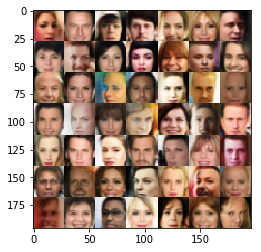

Epoch 3/5... Discriminator Loss: 0.8863... Generator Loss: 1.3969
Epoch 3/5... Discriminator Loss: 0.9465... Generator Loss: 1.4025
Epoch 3/5... Discriminator Loss: 0.6525... Generator Loss: 2.1261
Epoch 3/5... Discriminator Loss: 0.9076... Generator Loss: 1.5625
Epoch 3/5... Discriminator Loss: 0.7866... Generator Loss: 1.6506
Epoch 3/5... Discriminator Loss: 0.7750... Generator Loss: 2.2272
Epoch 3/5... Discriminator Loss: 0.8485... Generator Loss: 1.3269
Epoch 3/5... Discriminator Loss: 0.7370... Generator Loss: 2.0561
Epoch 3/5... Discriminator Loss: 1.0571... Generator Loss: 2.7448
Epoch 3/5... Discriminator Loss: 0.8299... Generator Loss: 2.2886


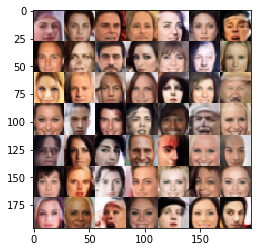

Epoch 3/5... Discriminator Loss: 0.8793... Generator Loss: 1.4661
Epoch 3/5... Discriminator Loss: 0.8554... Generator Loss: 1.9212
Epoch 3/5... Discriminator Loss: 0.7598... Generator Loss: 2.0214
Epoch 3/5... Discriminator Loss: 0.7153... Generator Loss: 1.8237
Epoch 3/5... Discriminator Loss: 0.8841... Generator Loss: 1.4328
Epoch 3/5... Discriminator Loss: 0.6699... Generator Loss: 2.3304
Epoch 3/5... Discriminator Loss: 1.0594... Generator Loss: 1.2693
Epoch 3/5... Discriminator Loss: 0.8522... Generator Loss: 1.5050
Epoch 3/5... Discriminator Loss: 0.7582... Generator Loss: 1.4383
Epoch 3/5... Discriminator Loss: 0.7643... Generator Loss: 2.1052


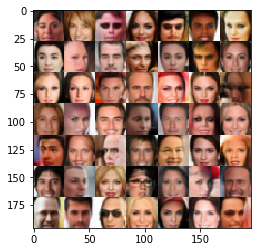

Epoch 3/5... Discriminator Loss: 0.8254... Generator Loss: 1.5994
Epoch 3/5... Discriminator Loss: 0.6814... Generator Loss: 2.2038
Epoch 3/5... Discriminator Loss: 1.0867... Generator Loss: 1.1589
Epoch 3/5... Discriminator Loss: 0.7302... Generator Loss: 1.4973
Epoch 3/5... Discriminator Loss: 1.0154... Generator Loss: 1.0950
Epoch 3/5... Discriminator Loss: 1.1351... Generator Loss: 1.0097
Epoch 3/5... Discriminator Loss: 0.7083... Generator Loss: 2.0527
Epoch 3/5... Discriminator Loss: 0.9470... Generator Loss: 1.2207
Epoch 3/5... Discriminator Loss: 0.8557... Generator Loss: 2.3171
Epoch 3/5... Discriminator Loss: 1.0527... Generator Loss: 1.2742


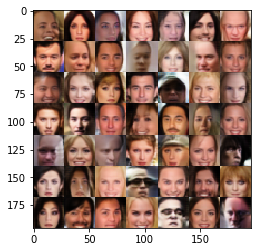

Epoch 3/5... Discriminator Loss: 0.8046... Generator Loss: 1.9718
Epoch 3/5... Discriminator Loss: 0.7797... Generator Loss: 2.0776
Epoch 3/5... Discriminator Loss: 0.9944... Generator Loss: 1.2954
Epoch 3/5... Discriminator Loss: 0.9032... Generator Loss: 1.3302
Epoch 3/5... Discriminator Loss: 0.8465... Generator Loss: 1.9806
Epoch 3/5... Discriminator Loss: 1.0050... Generator Loss: 0.9492
Epoch 3/5... Discriminator Loss: 1.0399... Generator Loss: 1.1972
Epoch 3/5... Discriminator Loss: 0.7565... Generator Loss: 1.6932
Epoch 3/5... Discriminator Loss: 0.7233... Generator Loss: 2.1294
Epoch 3/5... Discriminator Loss: 0.8510... Generator Loss: 2.3231


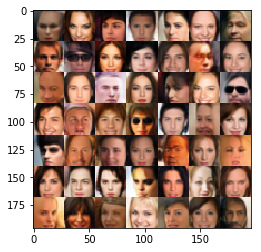

Epoch 3/5... Discriminator Loss: 1.2923... Generator Loss: 0.9248
Epoch 3/5... Discriminator Loss: 0.8647... Generator Loss: 1.6129
Epoch 3/5... Discriminator Loss: 0.6973... Generator Loss: 1.8076
Epoch 3/5... Discriminator Loss: 0.6959... Generator Loss: 2.7517
Epoch 3/5... Discriminator Loss: 0.7543... Generator Loss: 2.0188
Epoch 3/5... Discriminator Loss: 0.9423... Generator Loss: 1.1381
Epoch 3/5... Discriminator Loss: 0.6275... Generator Loss: 2.7882
Epoch 3/5... Discriminator Loss: 0.8431... Generator Loss: 1.7699
Epoch 3/5... Discriminator Loss: 0.7047... Generator Loss: 2.1523
Epoch 3/5... Discriminator Loss: 0.7465... Generator Loss: 2.4014


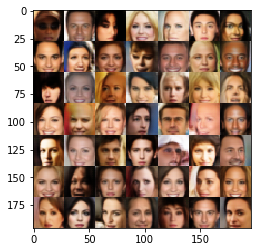

Epoch 3/5... Discriminator Loss: 0.8110... Generator Loss: 1.5761
Epoch 3/5... Discriminator Loss: 0.7868... Generator Loss: 1.6583
Epoch 3/5... Discriminator Loss: 0.8422... Generator Loss: 1.6299
Epoch 3/5... Discriminator Loss: 0.7702... Generator Loss: 1.7536
Epoch 3/5... Discriminator Loss: 0.8839... Generator Loss: 1.4530
Epoch 3/5... Discriminator Loss: 0.7921... Generator Loss: 1.6670
Epoch 3/5... Discriminator Loss: 0.9704... Generator Loss: 1.3768
Epoch 3/5... Discriminator Loss: 0.6903... Generator Loss: 1.9423
Epoch 3/5... Discriminator Loss: 0.8210... Generator Loss: 1.5581
Epoch 3/5... Discriminator Loss: 0.9580... Generator Loss: 1.3223


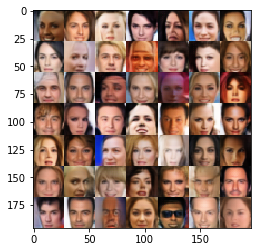

Epoch 3/5... Discriminator Loss: 0.7663... Generator Loss: 1.9026
Epoch 3/5... Discriminator Loss: 1.1259... Generator Loss: 1.0029
Epoch 3/5... Discriminator Loss: 0.7384... Generator Loss: 1.8599
Epoch 3/5... Discriminator Loss: 0.8633... Generator Loss: 2.4384
Epoch 3/5... Discriminator Loss: 0.9619... Generator Loss: 0.9478
Epoch 3/5... Discriminator Loss: 0.9687... Generator Loss: 2.8146
Epoch 3/5... Discriminator Loss: 0.9297... Generator Loss: 1.1426
Epoch 3/5... Discriminator Loss: 0.7011... Generator Loss: 2.2292
Epoch 3/5... Discriminator Loss: 0.7170... Generator Loss: 1.9356
Epoch 3/5... Discriminator Loss: 0.8101... Generator Loss: 1.6006


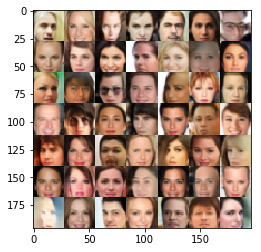

Epoch 3/5... Discriminator Loss: 0.7634... Generator Loss: 2.0955
Epoch 3/5... Discriminator Loss: 0.6773... Generator Loss: 1.8653
Epoch 3/5... Discriminator Loss: 0.7219... Generator Loss: 1.7506
Epoch 3/5... Discriminator Loss: 0.7826... Generator Loss: 2.6847
Epoch 3/5... Discriminator Loss: 0.9677... Generator Loss: 2.1495
Epoch 3/5... Discriminator Loss: 1.0772... Generator Loss: 2.2653
Epoch 3/5... Discriminator Loss: 0.8504... Generator Loss: 1.6835
Epoch 3/5... Discriminator Loss: 0.7562... Generator Loss: 1.4466
Epoch 3/5... Discriminator Loss: 0.7220... Generator Loss: 2.3356
Epoch 3/5... Discriminator Loss: 1.4609... Generator Loss: 0.7807


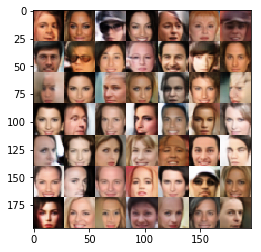

Epoch 3/5... Discriminator Loss: 0.8067... Generator Loss: 1.5692
Epoch 3/5... Discriminator Loss: 0.7162... Generator Loss: 1.9206
Epoch 3/5... Discriminator Loss: 0.7687... Generator Loss: 2.5169
Epoch 3/5... Discriminator Loss: 0.8719... Generator Loss: 1.5154
Epoch 3/5... Discriminator Loss: 1.0159... Generator Loss: 1.0097
Epoch 3/5... Discriminator Loss: 0.7618... Generator Loss: 1.3954
Epoch 3/5... Discriminator Loss: 1.0332... Generator Loss: 1.1447
Epoch 3/5... Discriminator Loss: 0.8099... Generator Loss: 1.8201
Epoch 3/5... Discriminator Loss: 0.8219... Generator Loss: 1.5122
Epoch 3/5... Discriminator Loss: 0.9690... Generator Loss: 1.0533


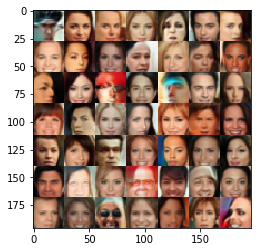

Epoch 3/5... Discriminator Loss: 0.9918... Generator Loss: 1.0017
Epoch 3/5... Discriminator Loss: 1.0862... Generator Loss: 1.0682
Epoch 3/5... Discriminator Loss: 0.7334... Generator Loss: 2.2532
Epoch 3/5... Discriminator Loss: 0.8013... Generator Loss: 2.0304
Epoch 3/5... Discriminator Loss: 0.8788... Generator Loss: 1.2773
Epoch 3/5... Discriminator Loss: 0.8758... Generator Loss: 2.6906
Epoch 3/5... Discriminator Loss: 0.7511... Generator Loss: 2.1422
Epoch 3/5... Discriminator Loss: 0.6290... Generator Loss: 2.5834
Epoch 3/5... Discriminator Loss: 0.6852... Generator Loss: 1.6903
Epoch 3/5... Discriminator Loss: 0.8141... Generator Loss: 1.8698


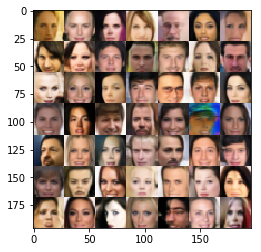

Epoch 3/5... Discriminator Loss: 0.7452... Generator Loss: 2.1123
Epoch 3/5... Discriminator Loss: 1.4439... Generator Loss: 0.9097
Epoch 3/5... Discriminator Loss: 0.6916... Generator Loss: 1.9610
Epoch 3/5... Discriminator Loss: 0.7713... Generator Loss: 1.9720
Epoch 3/5... Discriminator Loss: 0.6265... Generator Loss: 2.1707
Epoch 3/5... Discriminator Loss: 0.9387... Generator Loss: 1.2334
Epoch 3/5... Discriminator Loss: 0.7046... Generator Loss: 2.2110
Epoch 3/5... Discriminator Loss: 0.8725... Generator Loss: 1.4312
Epoch 3/5... Discriminator Loss: 0.9143... Generator Loss: 1.1999
Epoch 3/5... Discriminator Loss: 0.7211... Generator Loss: 2.2227


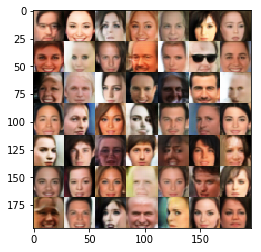

Epoch 3/5... Discriminator Loss: 0.6926... Generator Loss: 2.2529
Epoch 3/5... Discriminator Loss: 0.7211... Generator Loss: 1.7411
Epoch 3/5... Discriminator Loss: 0.6779... Generator Loss: 2.2704
Epoch 3/5... Discriminator Loss: 0.9101... Generator Loss: 1.4820
Epoch 3/5... Discriminator Loss: 0.6980... Generator Loss: 1.8360
Epoch 3/5... Discriminator Loss: 0.8403... Generator Loss: 2.0273
Epoch 3/5... Discriminator Loss: 0.6065... Generator Loss: 2.6265
Epoch 3/5... Discriminator Loss: 0.7101... Generator Loss: 1.9562
Epoch 3/5... Discriminator Loss: 1.0025... Generator Loss: 1.4513
Epoch 3/5... Discriminator Loss: 0.7891... Generator Loss: 1.7742


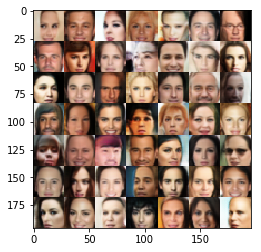

Epoch 3/5... Discriminator Loss: 0.7354... Generator Loss: 2.6263
Epoch 3/5... Discriminator Loss: 0.7071... Generator Loss: 2.3451
Epoch 3/5... Discriminator Loss: 0.7411... Generator Loss: 2.5393
Epoch 3/5... Discriminator Loss: 0.8337... Generator Loss: 1.5935
Epoch 3/5... Discriminator Loss: 0.7938... Generator Loss: 1.4553
Epoch 3/5... Discriminator Loss: 0.7051... Generator Loss: 2.0389
Epoch 3/5... Discriminator Loss: 0.8495... Generator Loss: 1.4612
Epoch 3/5... Discriminator Loss: 0.8158... Generator Loss: 1.5275
Epoch 3/5... Discriminator Loss: 0.7665... Generator Loss: 2.3521
Epoch 3/5... Discriminator Loss: 0.7008... Generator Loss: 1.7993


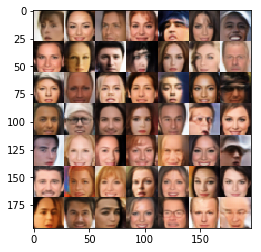

Epoch 3/5... Discriminator Loss: 0.7422... Generator Loss: 1.7415
Epoch 3/5... Discriminator Loss: 0.7370... Generator Loss: 2.0832
Epoch 3/5... Discriminator Loss: 0.8025... Generator Loss: 1.4954
Epoch 3/5... Discriminator Loss: 0.6692... Generator Loss: 2.4898
Epoch 3/5... Discriminator Loss: 0.8036... Generator Loss: 1.5311
Epoch 3/5... Discriminator Loss: 0.6563... Generator Loss: 2.3027
Epoch 3/5... Discriminator Loss: 0.8036... Generator Loss: 1.8518
Epoch 3/5... Discriminator Loss: 0.6580... Generator Loss: 2.2678
Epoch 3/5... Discriminator Loss: 0.6412... Generator Loss: 2.1453
Epoch 3/5... Discriminator Loss: 0.8358... Generator Loss: 2.1220


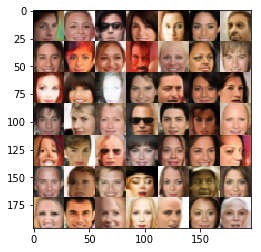

Epoch 3/5... Discriminator Loss: 0.7100... Generator Loss: 2.0271
Epoch 3/5... Discriminator Loss: 0.7178... Generator Loss: 2.0036
Epoch 3/5... Discriminator Loss: 0.7882... Generator Loss: 1.8837
Epoch 3/5... Discriminator Loss: 0.6317... Generator Loss: 1.9456
Epoch 3/5... Discriminator Loss: 0.8205... Generator Loss: 2.1951
Epoch 3/5... Discriminator Loss: 0.7426... Generator Loss: 3.1717
Epoch 3/5... Discriminator Loss: 1.0173... Generator Loss: 2.7314
Epoch 3/5... Discriminator Loss: 1.0340... Generator Loss: 1.0826
Epoch 3/5... Discriminator Loss: 0.9830... Generator Loss: 2.7068
Epoch 3/5... Discriminator Loss: 0.6859... Generator Loss: 2.1862


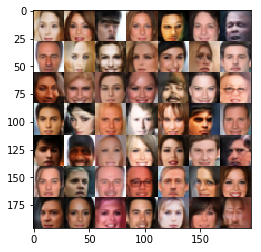

Epoch 3/5... Discriminator Loss: 0.7406... Generator Loss: 2.3510
Epoch 3/5... Discriminator Loss: 0.8709... Generator Loss: 2.4481
Epoch 3/5... Discriminator Loss: 0.8025... Generator Loss: 2.1594
Epoch 3/5... Discriminator Loss: 1.0944... Generator Loss: 1.0528
Epoch 3/5... Discriminator Loss: 0.7812... Generator Loss: 2.3821
Epoch 3/5... Discriminator Loss: 0.8661... Generator Loss: 1.4592
Epoch 3/5... Discriminator Loss: 0.8000... Generator Loss: 1.5870
Epoch 3/5... Discriminator Loss: 1.2085... Generator Loss: 0.7896
Epoch 3/5... Discriminator Loss: 0.7863... Generator Loss: 1.7148
Epoch 3/5... Discriminator Loss: 1.0353... Generator Loss: 2.9965


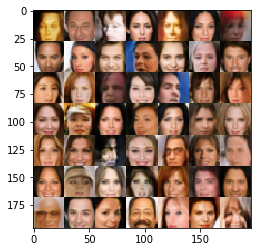

Epoch 3/5... Discriminator Loss: 0.7752... Generator Loss: 1.5798
Epoch 3/5... Discriminator Loss: 0.7836... Generator Loss: 1.8541
Epoch 3/5... Discriminator Loss: 0.6442... Generator Loss: 1.7289
Epoch 3/5... Discriminator Loss: 0.6606... Generator Loss: 2.2350
Epoch 3/5... Discriminator Loss: 0.8871... Generator Loss: 1.2539
Epoch 3/5... Discriminator Loss: 0.7898... Generator Loss: 2.5275
Epoch 3/5... Discriminator Loss: 0.6552... Generator Loss: 3.2925
Epoch 3/5... Discriminator Loss: 1.2077... Generator Loss: 1.1195
Epoch 3/5... Discriminator Loss: 0.8136... Generator Loss: 1.8410
Epoch 3/5... Discriminator Loss: 0.7137... Generator Loss: 2.2302


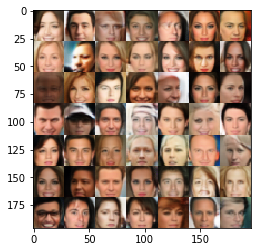

Epoch 3/5... Discriminator Loss: 0.8658... Generator Loss: 2.4326
Epoch 3/5... Discriminator Loss: 0.7220... Generator Loss: 2.5159
Epoch 3/5... Discriminator Loss: 0.8023... Generator Loss: 1.8503
Epoch 3/5... Discriminator Loss: 0.8009... Generator Loss: 1.6681
Epoch 3/5... Discriminator Loss: 0.7676... Generator Loss: 2.1414
Epoch 3/5... Discriminator Loss: 0.6745... Generator Loss: 2.2593
Epoch 3/5... Discriminator Loss: 0.6262... Generator Loss: 2.2967
Epoch 3/5... Discriminator Loss: 0.7083... Generator Loss: 1.8945
Epoch 3/5... Discriminator Loss: 0.7159... Generator Loss: 2.1730
Epoch 3/5... Discriminator Loss: 0.7685... Generator Loss: 1.7978


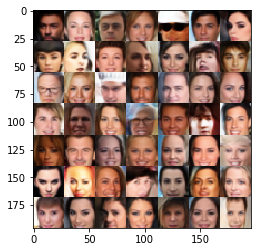

Epoch 3/5... Discriminator Loss: 0.6409... Generator Loss: 2.4700
Epoch 3/5... Discriminator Loss: 1.3499... Generator Loss: 0.8957
Epoch 3/5... Discriminator Loss: 0.7694... Generator Loss: 2.0094
Epoch 3/5... Discriminator Loss: 0.7404... Generator Loss: 1.6385
Epoch 3/5... Discriminator Loss: 0.6676... Generator Loss: 2.8078
Epoch 3/5... Discriminator Loss: 0.7471... Generator Loss: 1.7793
Epoch 3/5... Discriminator Loss: 1.0692... Generator Loss: 1.1382
Epoch 3/5... Discriminator Loss: 0.9641... Generator Loss: 1.2678
Epoch 3/5... Discriminator Loss: 0.6001... Generator Loss: 2.3840
Epoch 3/5... Discriminator Loss: 0.7656... Generator Loss: 2.0807


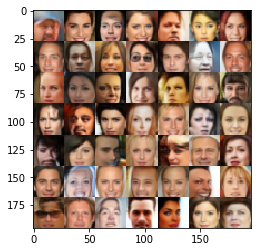

Epoch 3/5... Discriminator Loss: 0.7478... Generator Loss: 1.9415
Epoch 3/5... Discriminator Loss: 0.7176... Generator Loss: 2.6619
Epoch 3/5... Discriminator Loss: 0.9873... Generator Loss: 1.3699
Epoch 3/5... Discriminator Loss: 0.7567... Generator Loss: 1.7377
Epoch 3/5... Discriminator Loss: 1.2501... Generator Loss: 0.9847
Epoch 3/5... Discriminator Loss: 0.9869... Generator Loss: 3.4972
Epoch 3/5... Discriminator Loss: 1.3331... Generator Loss: 0.9047
Epoch 3/5... Discriminator Loss: 0.8645... Generator Loss: 1.2301
Epoch 3/5... Discriminator Loss: 0.9306... Generator Loss: 2.1046
Epoch 3/5... Discriminator Loss: 0.7042... Generator Loss: 2.2620


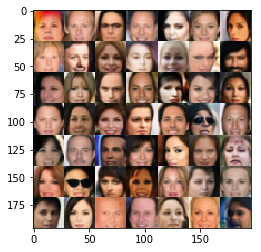

Epoch 3/5... Discriminator Loss: 0.8310... Generator Loss: 2.2463
Epoch 3/5... Discriminator Loss: 0.6703... Generator Loss: 2.1165
Epoch 3/5... Discriminator Loss: 1.2843... Generator Loss: 0.6672
Epoch 3/5... Discriminator Loss: 0.7121... Generator Loss: 2.0746
Epoch 3/5... Discriminator Loss: 0.6871... Generator Loss: 3.0823
Epoch 3/5... Discriminator Loss: 0.6446... Generator Loss: 2.4561
Epoch 3/5... Discriminator Loss: 0.7632... Generator Loss: 2.0780
Epoch 3/5... Discriminator Loss: 0.8569... Generator Loss: 1.9093
Epoch 3/5... Discriminator Loss: 0.9957... Generator Loss: 1.1621
Epoch 4/5... Discriminator Loss: 0.8228... Generator Loss: 1.6131


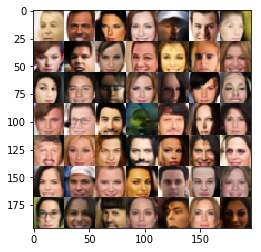

Epoch 4/5... Discriminator Loss: 0.6717... Generator Loss: 2.2202
Epoch 4/5... Discriminator Loss: 1.1836... Generator Loss: 0.9551
Epoch 4/5... Discriminator Loss: 0.6802... Generator Loss: 2.3267
Epoch 4/5... Discriminator Loss: 0.6681... Generator Loss: 2.0703
Epoch 4/5... Discriminator Loss: 0.8470... Generator Loss: 2.5461
Epoch 4/5... Discriminator Loss: 0.6394... Generator Loss: 1.7449
Epoch 4/5... Discriminator Loss: 0.7977... Generator Loss: 1.4978
Epoch 4/5... Discriminator Loss: 0.7644... Generator Loss: 1.8906
Epoch 4/5... Discriminator Loss: 0.6362... Generator Loss: 2.1077
Epoch 4/5... Discriminator Loss: 0.6236... Generator Loss: 2.2893


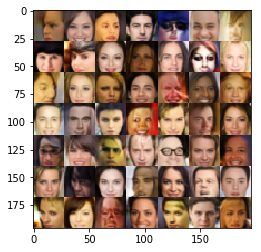

Epoch 4/5... Discriminator Loss: 0.7544... Generator Loss: 3.2761
Epoch 4/5... Discriminator Loss: 0.6898... Generator Loss: 2.2101
Epoch 4/5... Discriminator Loss: 0.7046... Generator Loss: 1.7314
Epoch 4/5... Discriminator Loss: 0.6593... Generator Loss: 2.3434
Epoch 4/5... Discriminator Loss: 0.8206... Generator Loss: 1.5075
Epoch 4/5... Discriminator Loss: 0.6942... Generator Loss: 2.4506
Epoch 4/5... Discriminator Loss: 0.9178... Generator Loss: 2.6150
Epoch 4/5... Discriminator Loss: 0.7450... Generator Loss: 2.3115
Epoch 4/5... Discriminator Loss: 0.6933... Generator Loss: 2.6609
Epoch 4/5... Discriminator Loss: 0.5977... Generator Loss: 2.1594


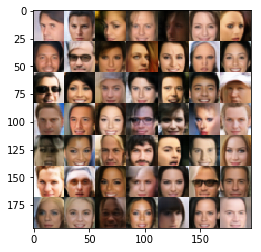

Epoch 4/5... Discriminator Loss: 0.5600... Generator Loss: 2.9353
Epoch 4/5... Discriminator Loss: 0.5676... Generator Loss: 2.7428
Epoch 4/5... Discriminator Loss: 0.6620... Generator Loss: 2.8022
Epoch 4/5... Discriminator Loss: 0.6019... Generator Loss: 2.3445
Epoch 4/5... Discriminator Loss: 0.5700... Generator Loss: 2.6305
Epoch 4/5... Discriminator Loss: 0.5395... Generator Loss: 2.5566
Epoch 4/5... Discriminator Loss: 0.7323... Generator Loss: 2.2543
Epoch 4/5... Discriminator Loss: 0.6628... Generator Loss: 1.7318
Epoch 4/5... Discriminator Loss: 0.7600... Generator Loss: 2.2990
Epoch 4/5... Discriminator Loss: 0.5747... Generator Loss: 2.5039


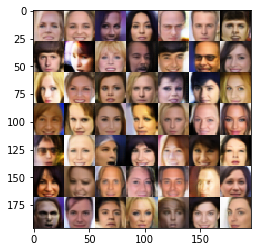

Epoch 4/5... Discriminator Loss: 1.0280... Generator Loss: 1.2022
Epoch 4/5... Discriminator Loss: 0.6874... Generator Loss: 1.8661
Epoch 4/5... Discriminator Loss: 0.8016... Generator Loss: 2.1703
Epoch 4/5... Discriminator Loss: 0.7328... Generator Loss: 2.5324
Epoch 4/5... Discriminator Loss: 0.6618... Generator Loss: 2.2163
Epoch 4/5... Discriminator Loss: 0.7493... Generator Loss: 2.2489
Epoch 4/5... Discriminator Loss: 0.6394... Generator Loss: 2.7549
Epoch 4/5... Discriminator Loss: 0.5653... Generator Loss: 2.2252
Epoch 4/5... Discriminator Loss: 0.9114... Generator Loss: 1.3066
Epoch 4/5... Discriminator Loss: 0.9843... Generator Loss: 1.2833


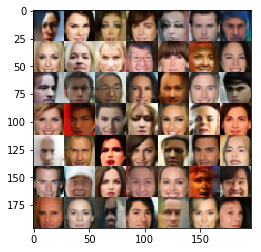

Epoch 4/5... Discriminator Loss: 0.7270... Generator Loss: 1.8571
Epoch 4/5... Discriminator Loss: 0.6296... Generator Loss: 2.1189
Epoch 4/5... Discriminator Loss: 0.7503... Generator Loss: 1.9202
Epoch 4/5... Discriminator Loss: 0.5251... Generator Loss: 3.0888
Epoch 4/5... Discriminator Loss: 0.5983... Generator Loss: 3.1737
Epoch 4/5... Discriminator Loss: 0.8208... Generator Loss: 1.5853
Epoch 4/5... Discriminator Loss: 0.6279... Generator Loss: 1.9635
Epoch 4/5... Discriminator Loss: 0.8745... Generator Loss: 2.4700
Epoch 4/5... Discriminator Loss: 0.7086... Generator Loss: 1.9841
Epoch 4/5... Discriminator Loss: 0.6660... Generator Loss: 2.1075


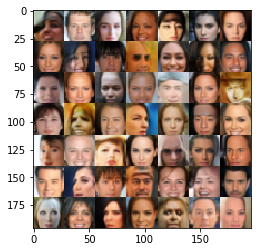

Epoch 4/5... Discriminator Loss: 0.7031... Generator Loss: 2.9865
Epoch 4/5... Discriminator Loss: 0.6659... Generator Loss: 2.2063
Epoch 4/5... Discriminator Loss: 0.5883... Generator Loss: 2.7140
Epoch 4/5... Discriminator Loss: 0.7677... Generator Loss: 1.7627


KeyboardInterrupt: 

In [73]:
batch_size = 64
z_dim = 100
beta1 = 0.5
alpha = 0.1

d_learning_rate = 0.001
g_learning_rate = 0.001
d_keep_prob = 0.8
g_keep_prob = 0.5
smooth = 0.1

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, d_learning_rate, g_learning_rate, beta1, d_keep_prob, g_keep_prob, alpha, smooth, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.